In [1]:
import sys
sys.path.insert(0, '/home/ethantu/workspace/good-vibrations')

from src2.dataset import process_masks, process_fft, DATA_INFO, build_dataset
from src2.model import VibrationTransformer
from src2.callbacks import OutputSaver

/home/ethantu/workspace/good-vibrations/.venv/lib/python3.12/site-packages/torch/cuda/__init__.py:61: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]


In [2]:
import json, math, base64, io
from pathlib import Path

from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.signal import find_peaks
from PIL import Image
from datasets import load_dataset
from huggingface_hub import snapshot_download
from composer import Trainer
from composer.core import Evaluator

In [3]:
NORMALIZE_MODE = 'std-sample'

In [4]:
# ── Run configuration ────────────────────────────────────────────────────────
# Set exactly one of these to identify the run, or none for dataset-only mode.
# Priority: FORWARD_OUTPUTS_DIR > MODEL_CHECKPOINT_PATH > RUN_NAME
#
#   FORWARD_OUTPUTS_DIR  — path to saved .pt outputs; skips inference entirely
#   MODEL_CHECKPOINT_PATH — absolute path to a .pt checkpoint; runs inference
#   RUN_NAME             — name of a run under RUNS_ROOT; uses latest checkpoint
#   DO_INFERENCE         — set False to force dataset-only mode regardless
# ─────────────────────────────────────────────────────────────────────────────
RUNS_ROOT = Path('/home/ethantu/workspace/good-vibrations/runs')

RUN_NAME              = 'std-sample-4'
MODEL_CHECKPOINT_PATH = None
FORWARD_OUTPUTS_DIR   = '/home/ethantu/workspace/good-vibrations/notebooks/runs/1778524809-fast-nuthatch'
DO_INFERENCE          = None

In [5]:
REPO_ID = "eturok-weizmann/laser-vibrations"
SPLITS = ['train', 'eval/base', 'eval/unseen_pos']
SPEAKERS = ['1000', '0100', '0010', '0001']
SPEAKER_TYPE = {'1000': 'white', '0100': 'white', '0010': 'black', '0001': 'black'}

In [6]:
# Bin sizes in mask pixels for grouping analysis. true_cx ∈ [0,20), true_cy ∈ [0,40).
# BIN_X=2 → 10 bins across width (20/2); BIN_Y=2 → 20 bins across height (40/2).
epsilon = 0.05
COM_BIN_SIZE_X = 1.6 - epsilon
COM_BIN_SIZE_Y = 2

In [7]:
BAD_SAMPLES_DICT = {
    # "incorrect-positions": {
    #     "0001": [525, 529, 313, 269, 225, 49, 53, 57, 61, 65, 69, 73, 77, 81, 29, 33, 37, 41],
    #     "0010": [526, 393, 530, 315, 270, 226, 50, 54, 58, 62, 66, 60, 74, 78, 82, 30, 34, 38, 42],
    #     "0100": [527, 317, 271, 227, 51, 55, 59, 63, 67, 71, 75, 79, 83, 31, 35, 39, 43],
    #     "1000": [528, 395, 396, 532, 272, 228, 52, 56, 60, 64, 68, 72, 76, 80, 84, 32, 36, 40, 44],
    # },
    "outlier-fft-magnitude": {
        "0001": [525, 529, 337],
        "0010": [526, 393, 530, 90, 94, 50, 54, 58, 62, 70, 74, 78, 82, 30, 38, 42],
        "0100": [527, 531, 394],
        "1000": [480, 528, 395, 532, 396, 52, 56, 60, 64, 68, 72, 76, 80, 84, 28, 32, 36, 40, 44],
    },
}
BAD_SAMPLES = {id for _bad_samples in BAD_SAMPLES_DICT.values() for ids in _bad_samples.values() for id in ids}

# 1. Load HF Dataset

In [8]:
ds = load_dataset(REPO_ID, split='train')
# Drop all media columns (Audio/Image types) — HF tries to decode them on iteration,
# which requires torchcodec/ffmpeg. We only need the path strings, which we get from manifest.
_media_cols = [c for c in ['overhead_file_name', 'speckle_vibrations_file_name',
                            'speckle_shifts_ifft_audio_file_name', 'audio_file_name',
                            'mask_file_name']
               if c in ds.column_names]
ds = ds.remove_columns(_media_cols)
ds

Dataset({
    features: ['sample_id', 'experiment_id', 'speakers', 'x_position', 'y_position', 'x_com', 'y_com', 'object', 'n_objects', 'box_material', 'experiment_dir', 'manifest'],
    num_rows: 551
})

In [9]:
fps_dict, overhead_rel, audio_rel, mask_rel, fft_rel = {}, {}, {}, {}, {}
for sample_id, manifest in zip(ds['sample_id'], ds['manifest']):
    m = json.loads(manifest)
    fps_dict[sample_id]     = m['experiment_config']['laser_camera']['capture']['fps']
    overhead_rel[sample_id] = m['artifacts']['overhead']
    audio_rel[sample_id]    = m['artifacts']['speckle_shifts_ifft_audio']
    mask_rel[sample_id]     = m['artifacts']['mask_npz']
    fft_rel[sample_id]      = m['artifacts']['speckle_shifts_fft']

In [10]:
# Always download overhead, audio, mask, and fft — HF is the single source of truth
patterns = list(set(overhead_rel.values()) | set(audio_rel.values())
               | set(mask_rel.values())    | set(fft_rel.values()))
_snap = Path(snapshot_download(REPO_ID, repo_type="dataset", allow_patterns=patterns))

overhead_img_paths = {k: _snap / v for k, v in overhead_rel.items()}
audio_paths        = {k: _snap / v for k, v in audio_rel.items()}
mask_paths         = {k: _snap / v for k, v in mask_rel.items()}
fft_paths          = {k: _snap / v for k, v in fft_rel.items()}

MASK_H, MASK_W = DATA_INFO['out_h'], DATA_INFO['out_w']

# tensor_store: single source of truth for mask_true + fft (keyed by sample_id)
print('Loading masks + FFTs from HF snapshot...')
tensor_store = {}
for sid in ds['sample_id']:
    fft_npz  = np.load(fft_paths[sid])
    raw_mask = torch.from_numpy(np.load(mask_paths[sid])['mask'])  # (H, W) bool
    # Downsample to model output resolution — identical to VibrationDataset
    mask_ds  = process_masks(raw_mask[None, None].float(), MASK_H, MASK_W, verbose=False).squeeze().numpy()
    tensor_store[sid] = {
        'fft':       fft_npz['fft'],    # (L, F, 2) complex64 — already reconstructed
        'freqs':     fft_npz['freqs'],  # (F,) float32
        'mask_true': mask_ds,           # (MASK_H, MASK_W) float32, values in [0, 1]
    }
print(f'  loaded {len(tensor_store)} samples  mask shape: {mask_ds.shape}')
print(f"fps: {len(fps_dict)}  overhead: {len(overhead_img_paths)}  audio: {len(audio_paths)}")

Fetching 2141 files:   0%|          | 0/2141 [00:00<?, ?it/s]

Loading masks + FFTs from HF snapshot...
  loaded 551 samples  mask shape: (40, 20)
fps: 551  overhead: 551  audio: 551


In [11]:
# --- Part 1: Dataset rows (always populated) ---
# Columns from HF (always): sample_id, overhead_path, audio_path, x_position, y_position,
#   n_objects, speakers, fps, speaker_type
# Computed from tensor_store (always): true_x_com, true_y_com, bin_cx, bin_cy,
#   fft_dom_peak_freq,
#   fft_mag_mean, fft_mag_std, fft_energy                            (normalize_mode=None)
#   fft_norm_mag_mean, fft_norm_mag_std, fft_norm_energy             (normalize_mode='std-sample')
#   fft_diff_mag_mean, fft_diff_mag_std, fft_diff_energy             (unnorm - empty box, same speaker)
#   fft_diff_norm_mag_mean, fft_diff_norm_mag_std, fft_diff_norm_energy  (norm - empty box norm)

def com(mask):
    s = mask.sum()
    if s == 0: return float('nan'), float('nan')
    cx = float(np.average(np.arange(mask.shape[1]), weights=mask.sum(0)))
    cy = float(np.average(np.arange(mask.shape[0]), weights=mask.sum(1)))
    return cx, cy

def _bin_com(v, size):
    return round(v / size) * size if v is not None and not np.isnan(v) else None

def _fft_stats(mag, prefix):
    return {
        f'{prefix}mag_mean': float(mag.mean()),
        f'{prefix}mag_std':  float(mag.std()),
        f'{prefix}energy':   float((mag ** 2).mean()),
    }

def _process_mag(fft_raw, normalize_mode, speakers):
    arr = process_fft(fft_raw[None], patch_size=DATA_INFO['patch_size'], signal_mode='magnitude',
                      normalize_mode=normalize_mode, speakers=speakers, patchify=False, verbose=False)
    return arr.squeeze(0).numpy()[..., 0]  # (L, F)

from scipy.signal import find_peaks as _find_peaks

# Build empty-box reference: one per speaker (n_objects==0, x_position is None)
# Each speaker has exactly one empty-box recording; match by speakers field.
empty_mag      = {}  # speaker -> mag (L, F), normalize_mode=None
empty_mag_norm = {}  # speaker -> mag (L, F), normalize_mode='std-sample'
for hf_row in ds:
    if hf_row['n_objects'] != 0:
        continue
    sid = hf_row['sample_id']
    spk = hf_row['speakers']
    fft_raw = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
    empty_mag[spk]      = _process_mag(fft_raw, normalize_mode=None,          speakers=[])
    empty_mag_norm[spk] = _process_mag(fft_raw, normalize_mode=NORMALIZE_MODE,  speakers=[spk])
print(f'Empty-box references built for speakers: {sorted(empty_mag.keys())}')

dataset_rows = []
for hf_row in ds:
    sid = hf_row['sample_id']
    if hf_row['x_position'] is None or hf_row['x_position'] == -1:
        continue

    mask_true_arr = np.asarray(tensor_store[sid]['mask_true'], dtype=float)
    true_cx, true_cy = com(mask_true_arr)
    bin_cx = _bin_com(true_cx, COM_BIN_SIZE_X)
    bin_cy = _bin_com(true_cy, COM_BIN_SIZE_Y)

    spk = hf_row['speakers']
    fft_raw   = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
    freqs_all = np.asarray(tensor_store[sid]['freqs'], dtype=float)  # (F,)
    fps_val   = fps_dict[sid]

    mag      = _process_mag(fft_raw, normalize_mode=None,         speakers=[])
    mag_norm = _process_mag(fft_raw, normalize_mode='std-sample', speakers=[spk])

    # dominant peak frequency (from unnormalized spectrum)
    mean_spectrum = mag.mean(0)
    peaks, _ = _find_peaks(mean_spectrum, height=mean_spectrum.mean())
    dom_peak_idx = int(peaks[np.argmax(mean_spectrum[peaks])]) if len(peaks) > 0 else 0

    # diff vs empty box (same speaker)
    mag_diff      = mag      - empty_mag[spk]
    mag_diff_norm = mag_norm - empty_mag_norm[spk]

    dataset_rows.append({
        'sample_id':    sid,
        'speakers':     spk,
        'n_objects':    hf_row['n_objects'],
        'overhead_path': overhead_img_paths.get(sid),
        'audio_path':   audio_paths.get(sid),
        'true_x_com':   true_cx,
        'true_y_com':   true_cy,
        'fps':          fps_val,
        'speaker_type': SPEAKER_TYPE.get(spk, 'unknown'),
        'bin_cx':       bin_cx,
        'bin_cy':       bin_cy,
        'fft_dom_peak_freq': float(freqs_all[dom_peak_idx]),
        **_fft_stats(mag,           'fft_'),
        **_fft_stats(mag_norm,      'fft_norm_'),
        **_fft_stats(mag_diff,      'fft_diff_'),
        **_fft_stats(mag_diff_norm, 'fft_diff_norm_'),
    })

df_dataset = pd.DataFrame(dataset_rows)
print(f'Dataset df: {len(df_dataset)} rows × {len(df_dataset.columns)} cols')
df_dataset


Empty-box references built for speakers: ['0001', '0010', '0100', '1000']
Dataset df: 509 rows × 24 cols


,sample_id,speakers,n_objects,overhead_path,audio_path,true_x_com,true_y_com,fps,speaker_type,bin_cx,...,fft_energy,fft_norm_mag_mean,fft_norm_mag_std,fft_norm_energy,fft_diff_mag_mean,fft_diff_mag_std,fft_diff_energy,fft_diff_norm_mag_mean,fft_diff_norm_mag_std,fft_diff_norm_energy
0,1,0001,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,black,4.65,...,14.501759,0.522490,0.912883,1.106351,0.093184,1.333859,1.787863,0.018479,0.370222,0.137406
1,2,0010,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,black,4.65,...,17.371487,0.518719,0.861668,1.011542,0.021280,1.374481,1.889651,0.035220,0.323569,0.105937
2,3,0100,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,white,4.65,...,252.143143,0.340400,0.689315,0.591028,-0.435031,3.973432,15.977414,0.001099,0.181734,0.033028
3,4,1000,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,white,4.65,...,272.912384,0.456185,0.849903,0.930439,-0.376084,3.808169,14.643593,-0.024768,0.223458,0.050547
4,5,0001,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,6.046806,5.223628,2500,black,6.20,...,16.279001,0.502204,0.922158,1.102584,0.131222,1.403548,1.987164,-0.001807,0.368006,0.135432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,532,1000,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,10.064018,27.055401,2500,white,9.30,...,19.525887,0.504451,0.880514,1.029775,-5.992297,12.636349,195.584885,0.023499,0.718474,0.516757
505,533,0001,2,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,3.171405,27.649134,2500,black,3.10,...,277.613403,0.342331,0.707144,0.617243,5.461560,13.480877,211.562683,-0.161680,0.771398,0.621195
506,534,0010,2,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,3.171405,27.649134,2500,black,3.10,...,281.998077,0.477900,0.860725,0.969236,6.023322,12.395967,189.940445,-0.005599,0.649372,0.421716
507,535,0100,2,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,3.171405,27.649134,2500,white,3.10,...,12.984382,0.545147,0.961235,1.221159,-5.688289,13.431267,212.755539,0.205846,0.766127,0.629322


# 2 Inference

In [12]:
def parse_run_config():
    """Resolve config variables into (do_inference, checkpoint_path, forward_outputs_dir)."""
    if DO_INFERENCE is False:
        return False, None, None

    if FORWARD_OUTPUTS_DIR:
        p = Path(FORWARD_OUTPUTS_DIR)
        assert p.exists(), f'FORWARD_OUTPUTS_DIR does not exist: {p}'
        return False, None, p

    if MODEL_CHECKPOINT_PATH:
        ckpt = Path(MODEL_CHECKPOINT_PATH)
        assert ckpt.exists(), f'MODEL_CHECKPOINT_PATH does not exist: {ckpt}'
        run_dir = RUNS_ROOT / ckpt.parent.parent.name  # runs/<name>/checkpoints/<file>
        out_dir = run_dir / 'forward_outputs'
        return True, ckpt, out_dir

    if RUN_NAME:
        run_dir = RUNS_ROOT / RUN_NAME
        assert run_dir.exists(), f'Run not found: {run_dir}'
        ckpt = run_dir / 'checkpoints' / 'latest-rank0.pt'
        assert ckpt.exists(), f'Checkpoint not found: {ckpt}'
        out_dir = run_dir / 'forward_outputs'
        return True, ckpt, out_dir

    raise ValueError('DO_INFERENCE=True but none of RUN_NAME / MODEL_CHECKPOINT_PATH / FORWARD_OUTPUTS_DIR is set')

_do_inference, _checkpoint_path, _forward_outputs_dir = parse_run_config()
print(f'do_inference={_do_inference}')
print(f'checkpoint  ={_checkpoint_path}')
print(f'outputs_dir ={_forward_outputs_dir}')

do_inference=False
checkpoint  =None
outputs_dir =/home/ethantu/workspace/good-vibrations/notebooks/runs/1778524809-fast-nuthatch


In [13]:
import gc
import psutil, os as _os

def _log_mem(tag):
    proc = psutil.Process(_os.getpid())
    rss_gb = proc.memory_info().rss / 1e9
    if torch.cuda.is_available():
        vram_alloc = torch.cuda.memory_allocated() / 1e9
        vram_res   = torch.cuda.memory_reserved()  / 1e9
        print(f'[mem] {tag}: RSS={rss_gb:.2f} GB  VRAM alloc={vram_alloc:.2f} GB  reserved={vram_res:.2f} GB')
    else:
        print(f'[mem] {tag}: RSS={rss_gb:.2f} GB')

def run_inference(checkpoint_path, forward_outputs_dir):
    """Run a full eval pass and save .pt outputs. Returns forward_outputs_dir."""
    forward_outputs_dir = Path(forward_outputs_dir)
    forward_outputs_dir.mkdir(parents=True, exist_ok=True)

    train_loader, eval_loaders, _ = build_dataset(batch_size=600, eval_batch_size=600, normalize_mode=NORMALIZE_MODE)

    data_loaders = eval_loaders + [Evaluator(label='train', dataloader=train_loader)]
    trainer = Trainer(
        model=VibrationTransformer(),
        load_path=str(checkpoint_path),
        callbacks=OutputSaver('1ep', str(forward_outputs_dir), overwrite=True),
        progress_bar=False,
    )
    trainer.eval(data_loaders)
    _log_mem('after trainer.eval')

    trainer.close()

    # 1. Move model off GPU and clear last-batch tensors before dropping references.
    #    trainer.state.model is Composer's wrapped object — not the VibrationTransformer()
    #    we passed in. Clearing outputs/batch drops the 0.97 GB of live activations.
    trainer.state.model.cpu()
    trainer.state.outputs = None
    trainer.state.batch   = None

    # 2. Drop all Python references so refcounts hit zero.
    #    DataLoader workers shut down automatically when their loader is GC'd.
    del trainer, data_loaders, eval_loaders, train_loader

    # 3. Collect any reference cycles (DataLoader/Dataset can form them).
    gc.collect()

    # 4. Return the now-unallocated CUDA pages to the OS.
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    _log_mem('after cleanup')
    print(f'Inference done -> {forward_outputs_dir}')
    return forward_outputs_dir


if _do_inference:
    _forward_outputs_dir = run_inference(_checkpoint_path, _forward_outputs_dir)

# 3 Load Forward Outputs

In [14]:
def load_forward_outputs(forward_outputs_dir):
    """Load saved .pt output files. Returns run_name and run_data dict."""
    forward_outputs_dir = Path(forward_outputs_dir)
    def _most_recent(d): return max(d.iterdir(), key=lambda p: p.stat().st_mtime)

    run_name = forward_outputs_dir.parent.name  # runs/<run_name>/forward_outputs
    run_data = {}
    for split in SPLITS:
        path = _most_recent(forward_outputs_dir / split)
        print(f'  loading {split} <- {path.name}')
        output = torch.load(path)
        output |= output.pop('info').items()
        run_data |= {f'{split}/{k}': v for k, v in output.items()}
    return run_name, run_data


run_data = {}
RUN_NAME = None

if _forward_outputs_dir is not None:
    RUN_NAME, run_data = load_forward_outputs(_forward_outputs_dir)
    print(f'Loaded run: {RUN_NAME}')
else:
    print('Dataset-only mode — no run loaded')

  loading train <- ep16500-ba115500.pt
  loading eval/base <- ep16500-ba115500.pt
  loading eval/unseen_pos <- ep16500-ba115500.pt
Loaded run: runs


/home/ethantu/workspace/good-vibrations/.venv/lib/python3.12/site-packages/torch/cuda/__init__.py:1061: UserWarning: Can't initialize NVML
  raw_cnt = _raw_device_count_nvml()


In [15]:
run_data.keys()

dict_keys(['train/fft', 'train/mask_pred', 'train/mask_true', 'train/sample_id', 'train/x_position', 'train/y_position', 'train/n_objects', 'train/speakers', 'eval/base/fft', 'eval/base/mask_pred', 'eval/base/mask_true', 'eval/base/sample_id', 'eval/base/x_position', 'eval/base/y_position', 'eval/base/n_objects', 'eval/base/speakers', 'eval/unseen_pos/fft', 'eval/unseen_pos/mask_pred', 'eval/unseen_pos/mask_true', 'eval/unseen_pos/sample_id', 'eval/unseen_pos/x_position', 'eval/unseen_pos/y_position', 'eval/unseen_pos/n_objects', 'eval/unseen_pos/speakers'])

In [16]:
def build_df_run(run_data):
    """Parse run_data into df_run and store mask_preds in tensor_store."""
    # sanity check: mask_true in run .pt must match HF
    print('Sanity checking mask_true (run .pt vs HF)...')
    n_checked = n_mismatch = 0
    for split in SPLITS:
        for i in range(len(run_data[f"{split}/sample_id"])):
            sid = run_data[f"{split}/sample_id"][i].item()
            if sid not in tensor_store: continue
            mt_run = np.asarray(run_data[f"{split}/mask_true"][i], dtype=float)
            mt_hf  = np.asarray(tensor_store[sid]['mask_true'], dtype=float)
            if not np.allclose(mt_run, mt_hf, atol=1e-4):
                print(f'  MISMATCH  sample_id={sid}  split={split}  max_diff={np.abs(mt_run-mt_hf).max():.5f}')
                n_mismatch += 1
            n_checked += 1
    print(f'  checked {n_checked} samples, {n_mismatch} mismatches')

    def _mcom(arr, bmask):
        sub = arr * bmask; s = sub.sum()
        if s < 1e-9: return float('nan'), float('nan')
        H, W = arr.shape
        return float((sub.sum(0)*np.arange(W)).sum()/s), float((sub.sum(1)*np.arange(H)).sum()/s)

    run_rows = []
    for split in SPLITS:
        for i in range(len(run_data[f"{split}/sample_id"])):
            sid = run_data[f"{split}/sample_id"][i].item()
            x_pos = run_data[f"{split}/x_position"][i].item()
            y_pos = run_data[f"{split}/y_position"][i].item()
            if x_pos == -1 or y_pos == -1: continue

            mt = np.asarray(tensor_store[sid]['mask_true'], dtype=float)
            mp = np.asarray(run_data[f"{split}/mask_pred"][i], dtype=float)

            # store mask_pred in tensor_store (single source of truth)
            tensor_store[sid]['mask_pred'] = mp

            tx, ty = com(mt)
            px_, py_ = com(mp)
            dx, dy = px_ - tx, py_ - ty
            zero_mask, nonzero_mask = mt == 0, mt > 0
            pcx_nz, pcy_nz = _mcom(mp, nonzero_mask)
            tcx_nz, tcy_nz = _mcom(mt, nonzero_mask)

            run_rows.append({
                'sample_id': sid,
                'split': split,
                'run': RUN_NAME,
                'mse': float(np.mean((mp - mt)**2)),
                'mse_gt0': float(np.mean(mp[zero_mask]**2)) if zero_mask.any() else float('nan'),
                'mse_gt_nonzero': float(np.mean((mp[nonzero_mask]-mt[nonzero_mask])**2)) if nonzero_mask.any() else float('nan'),
                'pred_x_com': px_, 'pred_y_com': py_,
                'x_com_diff': dx,  'y_com_diff': dy,
                'com_dist': float((dx**2+dy**2)**0.5),
                'com_dist_gt_nonzero': float(((pcx_nz-tcx_nz)**2+(pcy_nz-tcy_nz)**2)**0.5) if not (np.isnan(pcx_nz) or np.isnan(tcx_nz)) else float('nan'),
                'pred_mass_gt0': float(mp[zero_mask].sum()) if zero_mask.any() else float('nan'),
            })
    return pd.DataFrame(run_rows)


RUN_COLS = ['split', 'run', 'mse', 'mse_gt0', 'mse_gt_nonzero',
            'pred_x_com', 'pred_y_com', 'x_com_diff', 'y_com_diff',
            'com_dist', 'com_dist_gt_nonzero', 'pred_mass_gt0']

if RUN_NAME is not None:
    df_run = build_df_run(run_data)
    del run_data
    df = df_dataset.merge(df_run[['sample_id'] + RUN_COLS], on='sample_id', how='inner')
    print(f'Run df merged: {len(df)} rows')
else:
    df = df_dataset.copy()
    for col in RUN_COLS + ['mask_pred']:
        df[col] = float('nan') if col not in ('split', 'run') else None
    print(f'Dataset-only df: {len(df)} rows')

df


Sanity checking mask_true (run .pt vs HF)...
  checked 531 samples, 0 mismatches
Run df merged: 500 rows


,sample_id,speakers,n_objects,overhead_path,audio_path,true_x_com,true_y_com,fps,speaker_type,bin_cx,...,mse,mse_gt0,mse_gt_nonzero,pred_x_com,pred_y_com,x_com_diff,y_com_diff,com_dist,com_dist_gt_nonzero,pred_mass_gt0
0,1,0001,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,black,4.65,...,0.008209,1.389268e-03,0.238592,4.701613,6.931034,-0.026310,1.701447,1.701651,1.321991,1.769803
1,2,0010,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,black,4.65,...,0.000003,1.325274e-07,0.000083,4.742691,5.268994,0.014767,0.039407,0.042083,0.006013,0.039176
2,3,0100,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,white,4.65,...,0.007155,6.484105e-05,0.246663,6.046593,6.038566,1.318669,0.808980,1.547041,0.797709,0.658151
3,4,1000,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,4.727924,5.229587,2500,white,4.65,...,0.000007,1.535751e-07,0.000245,4.753149,5.274765,0.025225,0.045178,0.051743,0.022540,0.053608
4,5,0001,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,6.046806,5.223628,2500,black,6.20,...,0.000001,2.441019e-07,0.000047,6.058275,5.266326,0.011469,0.042698,0.044211,0.011295,0.073129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,528,1000,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,11.435260,21.801427,2500,white,10.85,...,0.012367,4.097232e-04,0.435218,12.359184,28.779646,0.923924,6.978219,7.039117,1.953276,1.428140
496,529,0001,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,10.064018,27.055401,2500,black,9.30,...,0.010392,7.210565e-10,0.461873,10.436014,16.673189,0.371996,-10.382212,10.388874,2.154134,0.002680
497,530,0010,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,10.064018,27.055401,2500,black,9.30,...,0.010392,1.774156e-08,0.461873,15.981291,17.241873,5.917273,-9.813528,11.459470,NaN,0.005391
498,531,0100,1,/home/ethantu/.cache/huggingface/hub/datasets-...,/home/ethantu/.cache/huggingface/hub/datasets-...,10.064018,27.055401,2500,white,9.30,...,0.016111,5.850603e-03,0.461873,16.321017,15.701225,6.256999,-11.354176,12.964079,NaN,7.892704


# 3. Summary Statistics

In [17]:
# # Quick summary: bad vs good
# cols = ['mse', 'mse_gt0', 'mse_gt_nonzero', 'com_dist', 'com_dist_gt_nonzero', 'pred_mass_gt0']
# df.groupby('is_bad')[cols].agg(['mean', 'median', 'std']).round(4)

# 4. Dataset Viz

In [18]:
import time as _time
import shutil
import pickle

OVERHEAD_X0, OVERHEAD_Y0, OVERHEAD_X1, OVERHEAD_Y1 = 191, 191, 1260, 1147
OVERHEAD_THUMB_W, OVERHEAD_THUMB_H = 260, 240
CACHE_PATH    = Path('/home/ethantu/workspace/good-vibrations/tmp/position_explorer_cache.pkl')
SIDECAR_FNAME = 'position_explorer_lasers.json'
AUDIO_DIR     = 'audio'
OUT_DIR       = Path('/home/ethantu/workspace/good-vibrations/tmp')

class _NumpyEncoder(json.JSONEncoder):
    def default(self, o):
        if isinstance(o, np.integer): return int(o)
        if isinstance(o, np.floating): return float(o)
        if isinstance(o, np.ndarray): return o.tolist()
        return super().default(o)

def _img_to_b64(path):
    img = Image.open(path).convert('RGB')
    img = img.crop((OVERHEAD_X0, OVERHEAD_Y0, OVERHEAD_X1, OVERHEAD_Y1))
    img = img.resize((OVERHEAD_THUMB_W, OVERHEAD_THUMB_H), Image.LANCZOS)
    buf = io.BytesIO()
    img.save(buf, format='JPEG', quality=80)
    return 'data:image/jpeg;base64,' + base64.b64encode(buf.getvalue()).decode()

def _mask_com(mask):
    arr = np.asarray(mask, dtype=float)
    s = arr.sum()
    if s < 1e-9: return None, None
    H, W = arr.shape
    cx = float((arr.sum(0) * np.arange(W)).sum() / s)
    cy = float((arr.sum(1) * np.arange(H)).sum() / s)
    return cx, cy

def _quantize_spec(arr):
    arr = np.asarray(arr, dtype=np.float32)
    mn, mx = float(arr.min()), float(arr.max())
    rng = mx - mn
    q = np.zeros(arr.size, dtype=np.uint8) if rng < 1e-12 else np.clip(((arr - mn) / rng * 255), 0, 255).astype(np.uint8)
    return {'b64': base64.b64encode(q.tobytes()).decode(), 'shape': list(arr.shape), 'mn': mn, 'mx': mx}

CACHE_VERSION = 'v5'
def _cache_key():
    import hashlib, pickle as _pkl
    raw = _pkl.dumps({
        'v':         CACHE_VERSION,
        'run':       RUN_NAME,
        'df':        pd.util.hash_pandas_object(df, index=False).values.tobytes(),
        'has_preds': sorted(sid for sid, v in tensor_store.items() if 'mask_pred' in v),
    })
    return hashlib.md5(raw).hexdigest()

HAS_RUN = RUN_NAME is not None

def _build_cache(speakers, current_key):
    n_with_pred = sum(1 for v in tensor_store.values() if 'mask_pred' in v)
    print(f'  _build_cache: {n_with_pred}/{len(tensor_store)} samples have mask_pred in tensor_store')
    per_speaker, all_sidecar = {}, {}
    for spk in speakers:
        sdf = df[df['speakers'] == spk].copy()
        if sdf.empty: print(f'  {spk}: no data, skipping'); continue
        freqs, n_lasers = None, None
        positions_data, sidecar_specs = [], {}
        for _, row in sdf.iterrows():
            sid = int(row['sample_id'])

            # FFT + mask_true — always from tensor_store (HF)
            fft_raw   = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
            mag       = _process_mag(fft_raw, normalize_mode=None,          speakers=[])
            mag_norm  = _process_mag(fft_raw, normalize_mode='std-sample',  speakers=[spk])
            mag_diff      = mag      - empty_mag[spk]
            mag_diff_norm = mag_norm - empty_mag_norm[spk]
            if freqs is None:
                freqs    = np.asarray(tensor_store[sid]['freqs'], dtype=float).tolist()
                n_lasers = mag.shape[0]
            mt = np.asarray(tensor_store[sid]['mask_true'], dtype=float)
            cx, cy = _mask_com(mt)

            # mask_pred — from tensor_store (set by build_df_run), or None
            mp_raw = tensor_store[sid].get('mask_pred')
            mp = None if mp_raw is None else np.asarray(mp_raw, dtype=float)
            if mp is not None:
                pcx, pcy = _mask_com(mp)
                mse_val      = float(np.mean((mp - mt) ** 2))
                com_dist_val = float(np.sqrt((pcx-cx)**2 + (pcy-cy)**2)) if cx is not None and pcx is not None else None
                mask_pred_enc = _quantize_spec(mp)
                run_val = RUN_NAME  # always use the global RUN_NAME when mp is present
            else:
                pcx, pcy = None, None
                mse_val = com_dist_val = mask_pred_enc = run_val = None

            overhead_path = str(row['overhead_path']) if row.get('overhead_path') is not None else None
            audio_path    = str(row['audio_path'])    if row.get('audio_path')    is not None else None
            positions_data.append({
                'id': sid,
                'cx': cx, 'cy': cy, 'true_cx': cx, 'true_cy': cy,
                'pred_cx': pcx, 'pred_cy': pcy,
                'spec':           _quantize_spec(mag.mean(0)),
                'spec_norm':      _quantize_spec(mag_norm.mean(0)),
                'spec_diff':      _quantize_spec(mag_diff.mean(0)),
                'spec_diff_norm': _quantize_spec(mag_diff_norm.mean(0)),
                'mask_true': _quantize_spec(mt),
                'mask_pred': mask_pred_enc,
                'overhead_b64': _img_to_b64(overhead_path) if overhead_path else None,
                'overhead_path': overhead_path,
                'audio_fname': f'{AUDIO_DIR}/{sid}.wav',
                'audio_path': audio_path,
                'mse': mse_val,
                'com_dist': com_dist_val,
                'n_objects': int(row['n_objects']),
                'run': run_val,
            })
            sidecar_specs[str(sid)] = {'avg': _quantize_spec(mag)}
        em = empty_mag.get(spk)
        em_norm = empty_mag_norm.get(spk)
        empty_spec = {}
        if em is not None:
            empty_spec['spec']           = _quantize_spec(em.mean(0))
            empty_spec['spec_norm']      = _quantize_spec(em_norm.mean(0))
            empty_spec['spec_diff']      = _quantize_spec(np.zeros(em.shape[1], dtype=np.float32))
            empty_spec['spec_diff_norm'] = _quantize_spec(np.zeros(em.shape[1], dtype=np.float32))
        per_speaker[spk] = {
            'positions': positions_data, 'freqs': freqs, 'n_lasers': n_lasers, 'speaker': spk,
            'mask_h': DATA_INFO['out_h'], 'mask_w': DATA_INFO['out_w'], 'thumb_w': OVERHEAD_THUMB_W, 'thumb_h': OVERHEAD_THUMB_H,
            'empty_spec': empty_spec,
        }
        all_sidecar[spk] = sidecar_specs
        print(f'  {spk}: {len(positions_data)} samples built')
    CACHE_PATH.parent.mkdir(parents=True, exist_ok=True)
    with open(CACHE_PATH, 'wb') as f:
        pickle.dump({'key': current_key, 'per_speaker': per_speaker, 'all_sidecar': all_sidecar}, f)
    print(f'  cache saved ({CACHE_PATH.stat().st_size/1e6:.1f} MB)')


def build_viz(speakers: list | None = None, out_path=None, force_rebuild: bool = False):
    t0 = _time.perf_counter()
    if speakers is None:
        speakers = sorted(df['speakers'].unique().tolist())

    cache = None
    current_key = _cache_key()
    n_preds = sum(1 for v in tensor_store.values() if 'mask_pred' in v)
    print(f'build_viz: RUN_NAME={RUN_NAME}  tensor_store mask_preds={n_preds}  cache_key={current_key[:8]}...')
    if not force_rebuild and CACHE_PATH.exists():
        with open(CACHE_PATH, 'rb') as f:
            cache = pickle.load(f)
        if cache.get('key') != current_key:
            print('Cache stale (model outputs or df changed) — rebuilding...')
            cache = None
        elif not all(spk in cache['per_speaker'] for spk in speakers):
            print('Cache missing some speakers — rebuilding...')
            cache = None
        else:
            print(f'Cache hit — skipping data build')

    if cache is None:
        _build_cache(speakers, current_key)
        with open(CACHE_PATH, 'rb') as f:
            cache = pickle.load(f)

    per_speaker = {k: v for k, v in cache['per_speaker'].items() if k in speakers}
    all_sidecar = {k: v for k, v in cache['all_sidecar'].items() if k in speakers}

    for data in per_speaker.values():
        data['bin_x'] = float(COM_BIN_SIZE_X)
        data['bin_y'] = float(COM_BIN_SIZE_Y)
        data['has_run'] = HAS_RUN

    spk_tag  = '_'.join(sorted(per_speaker.keys()))
    run_tag  = RUN_NAME if RUN_NAME else 'dataset'
    out_path = Path(out_path) if out_path else OUT_DIR / f'position_explorer_{run_tag}_{spk_tag}.html'
    out_path.parent.mkdir(parents=True, exist_ok=True)

    sidecar_json = json.dumps(all_sidecar, cls=_NumpyEncoder)
    (out_path.parent / SIDECAR_FNAME).write_text(sidecar_json)
    print(f'  sidecar: {len(sidecar_json)/1e6:.1f} MB')

    audio_out_dir = out_path.parent / AUDIO_DIR
    audio_out_dir.mkdir(exist_ok=True)
    n_copied = n_skipped = n_missing = 0
    for _, row in df.drop_duplicates('sample_id').iterrows():
        sid, src = int(row['sample_id']), row.get('audio_path')
        if src is None or not Path(src).exists(): n_missing += 1; continue
        dst = audio_out_dir / f'{sid}.wav'
        if dst.exists(): n_skipped += 1
        else: shutil.copy2(src, dst); n_copied += 1
    print(f'  audio: {n_copied} copied, {n_skipped} present, {n_missing} missing')

    payload = json.dumps({'speakers': list(per_speaker.keys()), 'data': per_speaker}, cls=_NumpyEncoder)
    print(f'  payload total: {len(payload)/1e6:.1f} MB')
    template = Path('/home/ethantu/workspace/good-vibrations/notebooks/viz.html').read_text()
    out_path.write_text(template.replace('__PAYLOAD__', payload).replace('__SIDECAR_FNAME__', SIDECAR_FNAME))
    print(f'  HTML: {out_path.stat().st_size/1e6:.1f} MB  ->  {out_path}')
    print(f'Total: {_time.perf_counter()-t0:.1f}s')

    import socket, subprocess, sys
    PORT = 8891
    def _listening(p):
        with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as s: return s.connect_ex(('127.0.0.1', p)) == 0
    if not _listening(PORT):
        subprocess.Popen([sys.executable, '-m', 'http.server', str(PORT)],
                         cwd=str(out_path.parent), stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)
        _time.sleep(0.5)
        assert _listening(PORT), f'Server failed to start on port {PORT}'
        print(f'Started HTTP server on port {PORT}')
    print(f'\nURL: http://localhost:{PORT}/{out_path.name}')

In [19]:
build_viz()

build_viz: RUN_NAME=runs  tensor_store mask_preds=500  cache_key=5dbf2aeb...
Cache hit — skipping data build
  sidecar: 228.1 MB
  audio: 0 copied, 500 present, 0 missing
  payload total: 19.0 MB
  HTML: 19.1 MB  ->  /home/ethantu/workspace/good-vibrations/tmp/position_explorer_runs_0001_0010_0100_1000.html
Total: 0.5s
Started HTTP server on port 8891

URL: http://localhost:8891/position_explorer_runs_0001_0010_0100_1000.html


# 5. Worst Predictions

In [20]:
def filter_df(df, split=None, speaker=None, speaker_type=None, n_objects=None,
              position=None, sample_id=None, x_com=None, y_com=None,
              sort_by='com_dist', ascending=False, max_samples=None):
    df = df.copy()
    if split is not None:        df = df[df['split'] == split]
    if speaker is not None:      df = df[df['speakers'] == speaker]
    if speaker_type is not None: df = df[df['speaker_type'] == speaker_type]
    if n_objects is not None:    df = df[df['n_objects'] == n_objects]
    if position is not None:
        position = {position} if isinstance(position, tuple) else set(position)
        df = df[[(x, y) in position for x, y in df[['x_position', 'y_position']].itertuples(index=False)]]
    if sample_id is not None:
        ids = [sample_id] if isinstance(sample_id, int) else list(sample_id)
        df = df[df['sample_id'].isin(ids)]
    if x_com is not None:
        df = df[(df['true_x_com'] >= x_com[0]) & (df['true_x_com'] <= x_com[1])]
    if y_com is not None:
        df = df[(df['true_y_com'] >= y_com[0]) & (df['true_y_com'] <= y_com[1])]
    if sort_by is not None and sort_by in df.columns and not df[sort_by].isna().all():
        df = df.sort_values(sort_by, ascending=ascending)
    if max_samples is not None:
        df = df.iloc[:max_samples]
    return df

In [21]:
def plot_predictions(df, split=None, speaker=None, speaker_type=None, n_objects=None,
                     position=None, sample_id=None, x_com=None, y_com=None,
                     sort_by='com_dist', ascending=False, ncols=6, alpha=0.75, figsize_per_cell=(2.2, 2.8), max_samples=None):
    """
    Grid of overhead photos with predicted mask overlaid as a heatmap (Blues, transparent at 0).
    Ground truth is visible via the overhead image itself — no GT mask drawn.
    Green + = true COM.  Red + = pred COM.
    """
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    from PIL import Image

    sdf = filter_df(df, split=split, speaker=speaker, speaker_type=speaker_type,
                    n_objects=n_objects, position=position, sample_id=sample_id,
                    x_com=x_com, y_com=y_com, sort_by=sort_by, ascending=ascending, max_samples=max_samples)
    if sdf.empty:
        print("No samples match the filter.")
        return

    N = len(sdf)
    nrows = (N + ncols - 1) // ncols

    # Blues: white at 0 (fully transparent) → dark blue at 1 (opaque)
    # Use a darker portion of Blues (0.3→1.0) so low-confidence pixels still show colour
    blues_rgba = plt.get_cmap('Blues')(np.linspace(0.3, 1.0, 256))
    blues_rgba[:, 3] = np.linspace(0, alpha, 256)  # alpha ramps with confidence
    blue_cmap = mcolors.ListedColormap(blues_rgba)

    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(figsize_per_cell[0] * ncols, figsize_per_cell[1] * nrows))
    axes = np.array(axes).reshape(-1)
    for ax in axes:
        ax.axis('off')

    def _f(v):
        if v is None: return None
        try:
            fv = float(v)
            return None if np.isnan(fv) else fv
        except (TypeError, ValueError):
            return None

    for ax_i, (_, row) in enumerate(sdf.iterrows()):
        ax = axes[ax_i]
        sid = int(row['sample_id'])

        # Overhead photo — crop to box region, resize to fill axes
        img_path = overhead_img_paths.get(sid)
        if img_path and Path(img_path).exists():
            img = Image.open(img_path).convert('RGB')
            img = img.crop((OVERHEAD_X0, OVERHEAD_Y0, OVERHEAD_X1, OVERHEAD_Y1))
            ax.imshow(np.array(img), extent=[0, MASK_W, MASK_H, 0], aspect='auto')

        # Predicted mask overlay — heatmap, transparent where confidence is low
        mp = tensor_store[sid].get('mask_pred')
        if mp is not None:
            ax.imshow(np.asarray(mp, dtype=float), cmap=blue_cmap, vmin=0, vmax=1,
                      extent=[0, MASK_W, MASK_H, 0], aspect='auto')

        ax.set_xlim(0, MASK_W)
        ax.set_ylim(MASK_H, 0)

        tx, ty = _f(row.get('true_x_com')), _f(row.get('true_y_com'))
        px, py = _f(row.get('pred_x_com')), _f(row.get('pred_y_com'))

        if tx is not None:
            ax.plot(tx, ty, '+', color='#66ff88', markersize=8, markeredgewidth=1, zorder=5)
        if px is not None:
            ax.plot(px, py, '+', color='#66ccff', markersize=8, markeredgewidth=1, zorder=5)

        spk  = row.get('speakers', '?')
        spl  = row.get('split',    '?')
        objs = int(row['n_objects']) if _f(row.get('n_objects')) is not None else '?'
        cd   = _f(row.get('com_dist'))
        ms   = _f(row.get('mse'))

        line1 = f"id={sid}  {spl}  spk={spk}  objs={objs}"
        true_str = f"true=({tx:.1f},{ty:.1f})" if tx is not None else "true=(?)"
        pred_str = f"pred=({px:.1f},{py:.1f})" if px is not None else "pred=N/A"
        line2 = f"{true_str}  {pred_str}"
        line3 = f"dist={cd:.2f}  mse={ms:.4f}" if cd is not None and ms is not None else "dist=N/A"

        ax.set_title(f"{line1}\n{line2}\n{line3}",
                     fontsize=5.5, loc='left', pad=2, linespacing=1.4)

    filter_parts = []
    if split is not None:        filter_parts.append(f"split={split}")
    if speaker is not None:      filter_parts.append(f"spk={speaker}")
    if speaker_type is not None: filter_parts.append(f"spk_type={speaker_type}")
    if n_objects is not None:    filter_parts.append(f"objs={n_objects}")
    if position is not None:     filter_parts.append(f"pos={position}")
    if sample_id is not None:    filter_parts.append(f"sid={sample_id}")
    filter_str = "  ".join(filter_parts) if filter_parts else "all"

    com_col = sdf['com_dist'].dropna()
    mse_col = sdf['mse'].dropna()
    com_sum = f"mean_com={com_col.mean():.2f}\u00b1{com_col.std():.2f}" if len(com_col) else "mean_com=N/A"
    mse_sum = f"mean_mse={mse_col.mean():.4f}\u00b1{mse_col.std():.4f}" if len(mse_col) else "mean_mse=N/A"

    fig.suptitle(f"Mask Predictions  |  {filter_str}    n={N}    {com_sum}    {mse_sum}",
                 fontsize=9, y=1.005, fontweight='bold')
    plt.tight_layout()
    plt.show()

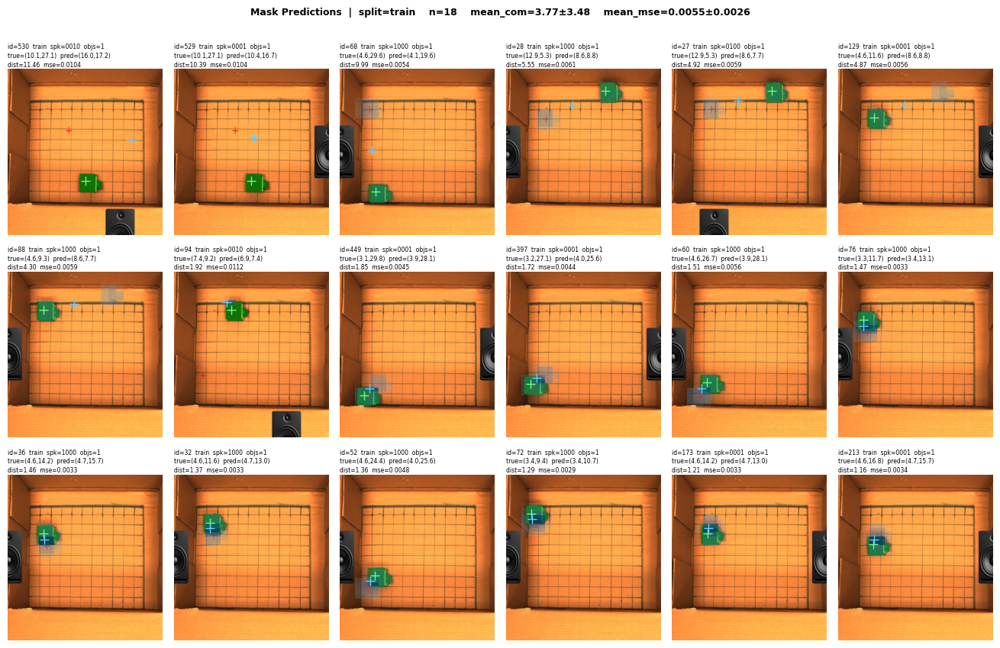

In [22]:
plt.close()
plot_predictions(df, split='train', max_samples=18)

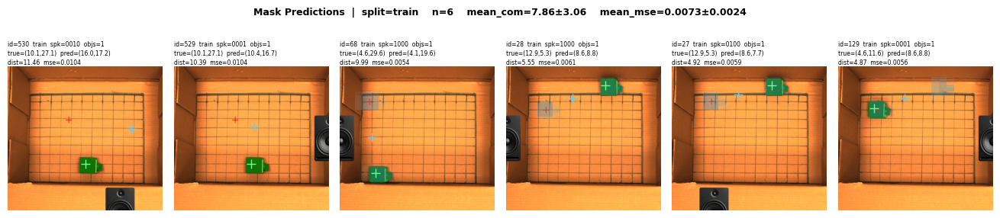

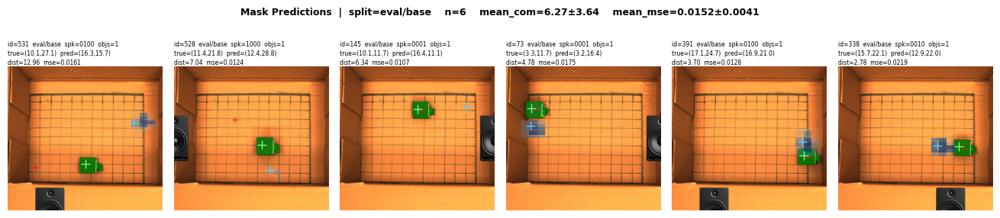

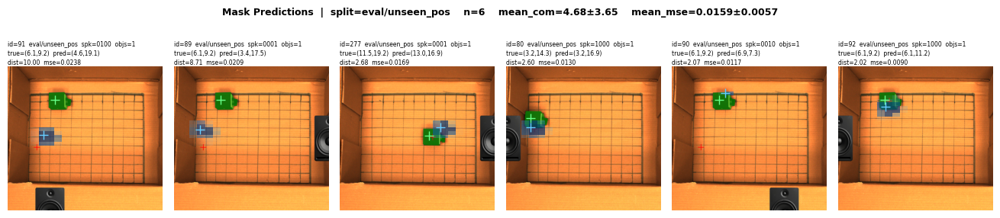

In [23]:
plt.close()
for split in SPLITS: plot_predictions(df, split=split, max_samples=6)

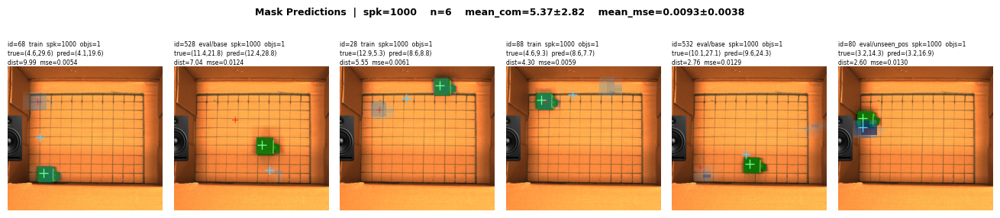

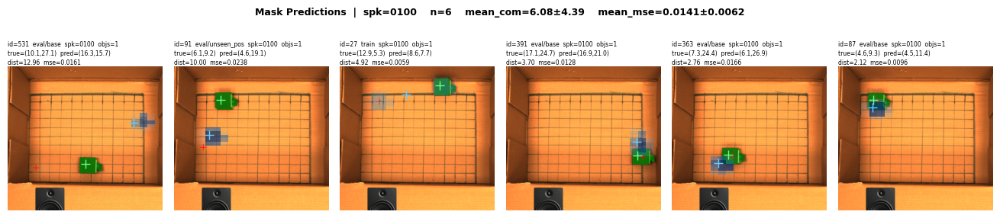

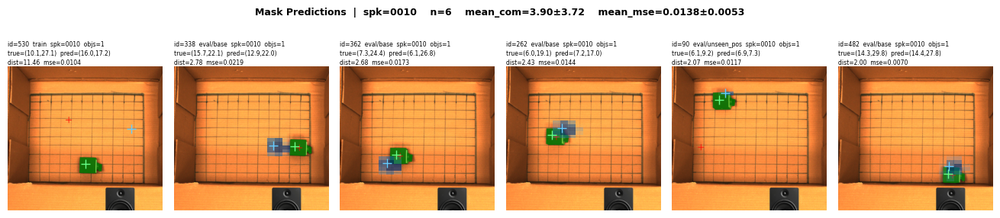

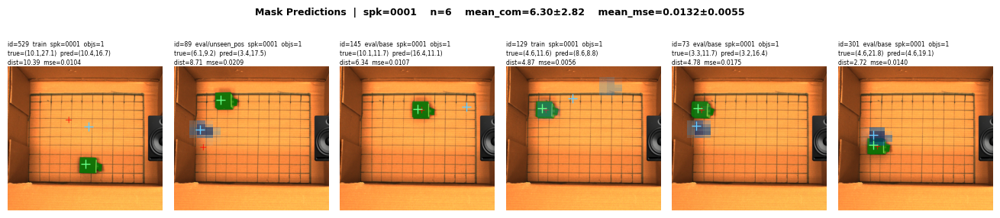

In [24]:
plt.close()
for speaker in SPEAKERS: plot_predictions(df, speaker=speaker, max_samples=6)

# 6. How does the train distribution impact errors?

In [25]:
def plot_error_distributions(df, split='eval/base', speaker=None, speaker_type=None, n_objects=None,
                              position=None, sample_id=None, x_com=None, y_com=None,
                              max_samples=None, vmax=None):
    """
    Three heatmaps: train prediction sum, FN distribution, FP distribution.
    split controls which eval split is used for FN/FP (default 'eval/base').
    All other filters apply to both train and the chosen eval split.
    """
    fdf = filter_df(df, speaker=speaker, speaker_type=speaker_type, n_objects=n_objects,
                    position=position, sample_id=sample_id, x_com=x_com, y_com=y_com,
                    max_samples=max_samples, sort_by=None)

    train_df = fdf[fdf['split'] == 'train']
    eval_df  = fdf[fdf['split'] == split]

    train_dist = np.zeros((MASK_H, MASK_W))
    fn_dist    = np.zeros((MASK_H, MASK_W))
    fp_dist    = np.zeros((MASK_H, MASK_W))

    for sid in train_df['sample_id']:
        mp = tensor_store[int(sid)].get('mask_pred')
        if mp is not None:
            train_dist += np.asarray(mp, dtype=float)

    for sid in eval_df['sample_id']:
        mp = tensor_store[int(sid)].get('mask_pred')
        mt = np.asarray(tensor_store[int(sid)]['mask_true'], dtype=float)
        if mp is None: continue
        mp = np.asarray(mp, dtype=float)
        fn_dist += np.maximum(0, mt - mp)
        fp_dist += np.maximum(0, mp - mt)

    if vmax is None: vmax = max(fn_dist.max(), fp_dist.max())

    filter_parts = []
    if speaker is not None:      filter_parts.append(f"spk={speaker}")
    if speaker_type is not None: filter_parts.append(f"spk_type={speaker_type}")
    if n_objects is not None:    filter_parts.append(f"objs={n_objects}")
    if position is not None:     filter_parts.append(f"pos={position}")
    if sample_id is not None:    filter_parts.append(f"sid={sample_id}")
    if max_samples is not None:  filter_parts.append(f"max={max_samples}")
    filter_str = "  ".join(filter_parts) if filter_parts else ""

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

    im1 = ax1.imshow(train_dist, cmap='Blues', aspect='auto')
    ax1.set_title(f"Train Data  (n={len(train_df)})")
    fig.colorbar(im1, ax=ax1, label='pred sum')

    im2 = ax2.imshow(fn_dist, cmap='Reds', aspect='auto', vmax=vmax)
    ax2.set_title(f"False Negatives  max(true−pred, 0)\n{split} (n={len(eval_df)})")
    fig.colorbar(im2, ax=ax2, label='FN sum')

    im3 = ax3.imshow(fp_dist, cmap='Oranges', aspect='auto', vmax=vmax)
    ax3.set_title(f"False Positives  max(pred−true, 0)\n{split} (n={len(eval_df)})")
    fig.colorbar(im3, ax=ax3, label='FP sum')

    fig.suptitle(f"Error Distributions\n{filter_str} n={len(eval_df)}  eval={split} n={len(eval_df)}",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    return vmax

np.float64(3.817966341972351)

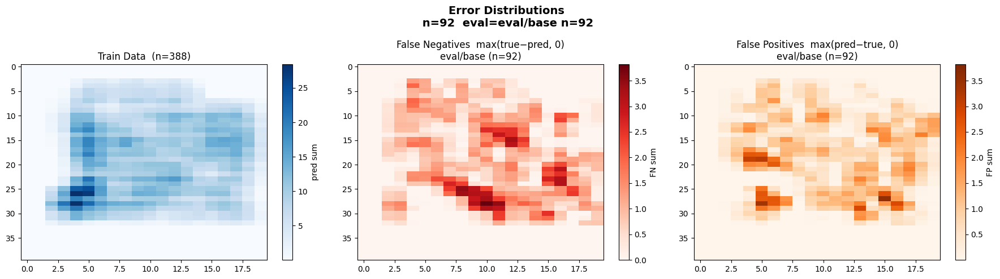

In [26]:
plot_error_distributions(df)

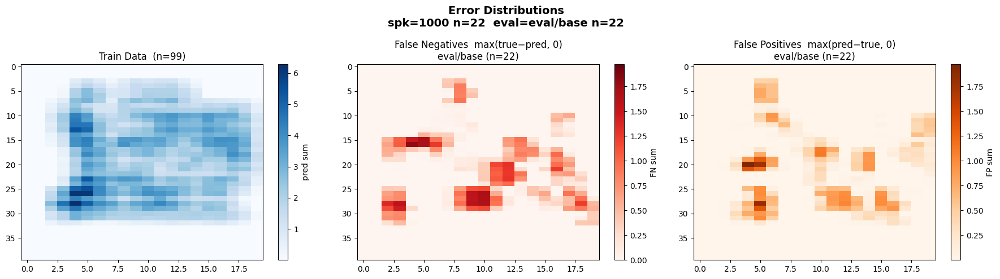

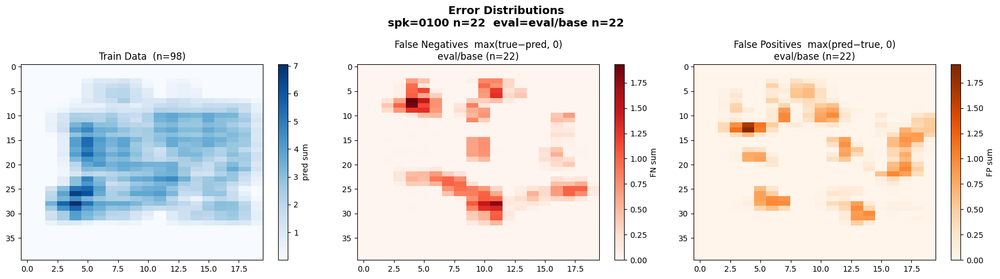

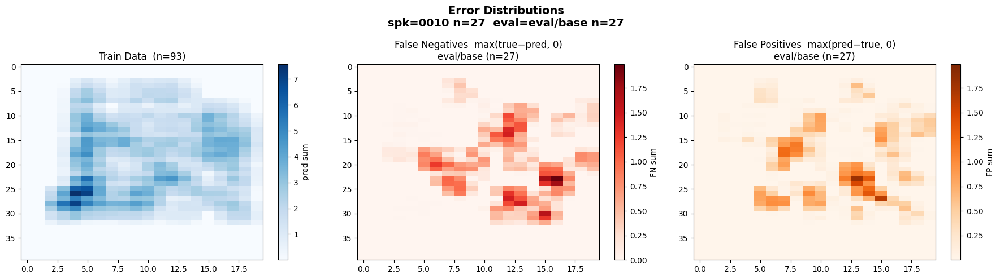

In [27]:
vmax = max([plot_error_distributions(df, speaker=speaker) for speaker in SPEAKERS])
plt.close()

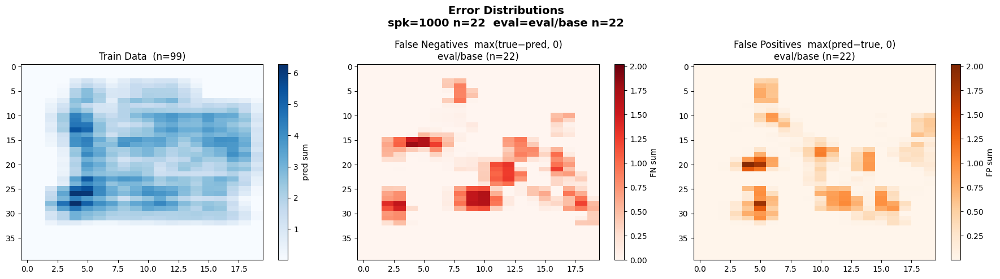

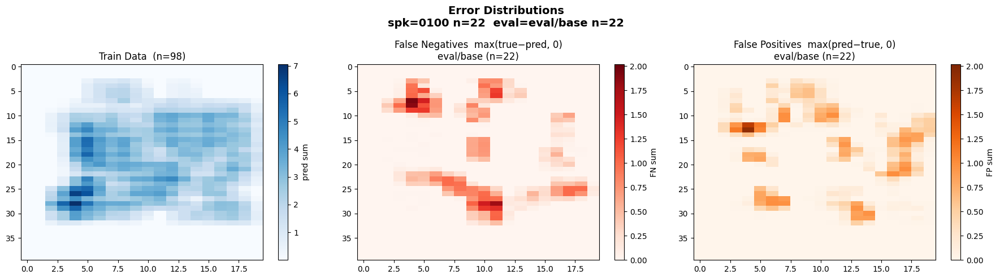

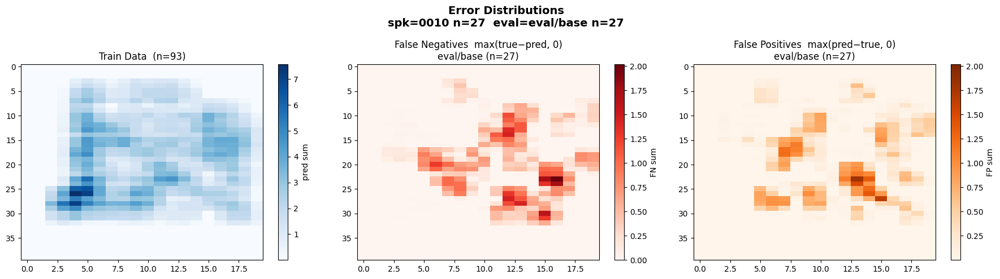

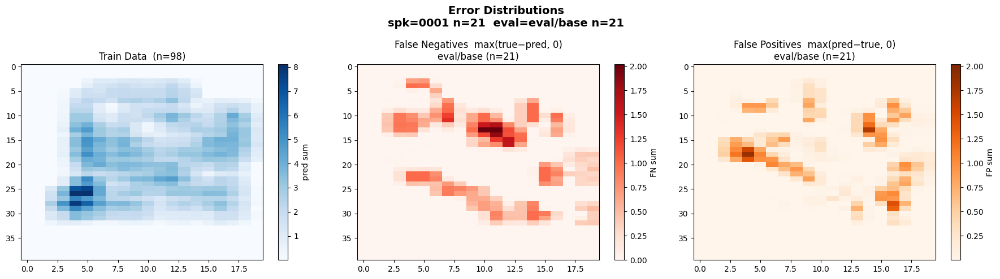

In [28]:
plt.close()
for speaker in SPEAKERS: plot_error_distributions(df, speaker=speaker, vmax=vmax)

# 7. How does the position in the box impact the errors?

In [29]:
# Per-speaker colorscales: white → color (Blues, Greens, Reds, Purples)
SPK_COLORSCALES = {
    '0001': {'name': 'Blues',   'lo': (240,248,255), 'hi': (8,48,107)},
    '0010': {'name': 'Greens',  'lo': (240,255,240), 'hi': (0,68,27)},
    '0100': {'name': 'Reds',    'lo': (255,245,240), 'hi': (103,0,13)},
    '1000': {'name': 'Purples', 'lo': (252,251,253), 'hi': (63,0,125)},
}

def plot_displacement_vectors(df, speaker=None, scale=1.0, split=None, speaker_type=None,
                              n_objects=None, position=None, sample_id=None,
                              x_com=None, y_com=None,
                              percentile_color=False, square=True, max_samples=None):
    """
    Vector displacement plot: one arrow per sample pointing from true_com toward
    pred_com, scaled by `scale`. speaker=None plots all 4 speakers together,
    each with its own colorscale. Color encodes com_dist (or percentile rank).
    Filtering via filter_df: split, speaker, speaker_type, n_objects, position, sample_id.
    """
    MASK_W, MASK_H = 20, 40
    SCALES = [round(s, 3) for s in np.geomspace(0.1, 10.0, 40)]
    default_idx = min(range(len(SCALES)), key=lambda i: abs(SCALES[i] - scale))

    df = filter_df(df, split=split, speaker_type=speaker_type, n_objects=n_objects,
                   position=position, sample_id=sample_id, x_com=x_com, y_com=y_com, sort_by=None, max_samples=max_samples)

    speakers = sorted(df['speakers'].unique()) if speaker is None else [speaker]

    # ---- per-speaker data --------------------------------------------------
    spk_data = {}
    for spk in speakers:
        sdf = df[df['speakers'] == spk].copy()
        sdf = sdf.dropna(subset=['true_x_com', 'true_y_com', 'pred_x_com', 'pred_y_com'])
        sdf = sdf.reset_index(drop=True)

        if percentile_color:
            color_vals = sdf['com_dist'].rank(pct=True).values
            cmin, cmax = 0.0, 1.0
        else:
            color_vals = sdf['com_dist'].values
            cmin, cmax = float(color_vals.min()), float(color_vals.max())

        hover = []
        for i, (_, row) in enumerate(sdf.iterrows()):
            last_line = (
                f"com_dist_pct={color_vals[i]*100:.0f}th  com_dist={row['com_dist']:.3f}<br>"
                if percentile_color else f"com_dist={row['com_dist']:.3f}<br>"
            )
            hover.append(
                f"id={int(row['sample_id'])}  spk={spk}  split={row['split']}<br>"
                f"true_com=({row['true_x_com']:.1f}, {row['true_y_com']:.1f})<br>"
                f"pred_com=({row['pred_x_com']:.1f}, {row['pred_y_com']:.1f})<br>"
                f"com_diff=({row['x_com_diff']:.2f}, {row['y_com_diff']:.2f})  " + last_line +
                f"mse={row['mse']:.4f}"
            )
        spk_data[spk] = dict(sdf=sdf, color_vals=color_vals, cmin=cmin, cmax=cmax, hover=hover)

    # ---- grid traces -------------------------------------------------------
    grid_traces = []
    for x in range(MASK_W + 1):
        grid_traces.append(go.Scatter(
            x=[x, x], y=[0, MASK_H], mode='lines',
            line=dict(color='rgba(100,110,150,0.25)', width=0.5),
            hoverinfo='skip', showlegend=False,
        ))
    for y in range(MASK_H + 1):
        grid_traces.append(go.Scatter(
            x=[0, MASK_W], y=[y, y], mode='lines',
            line=dict(color='rgba(100,110,150,0.25)', width=0.5),
            hoverinfo='skip', showlegend=False,
        ))
    n_grid = len(grid_traces)

    # ---- helpers -----------------------------------------------------------
    def _arrow_xy(sdf, sc):
        shaft_x, shaft_y, head_x, head_y, tail_x, tail_y, angles = [], [], [], [], [], [], []
        for _, row in sdf.iterrows():
            tx, ty = row['true_x_com'], row['true_y_com']
            dx = (row['pred_x_com'] - tx) * sc
            dy = (row['pred_y_com'] - ty) * sc
            hx, hy = tx + dx, ty + dy
            shaft_x += [tx, hx, None]; shaft_y += [ty, hy, None]
            head_x.append(hx); head_y.append(hy)
            tail_x.append(tx); tail_y.append(ty)
            angles.append(float(np.degrees(np.arctan2(dx, -dy))) % 360)
        return shaft_x, shaft_y, head_x, head_y, tail_x, tail_y, angles

    def _rgba(val, cmin, cmax, lo, hi, alpha=0.7):
        t = 0.0 if cmax == cmin else max(0.0, min(1.0, (val - cmin) / (cmax - cmin)))
        r = int(lo[0] + (hi[0] - lo[0]) * t)
        g = int(lo[1] + (hi[1] - lo[1]) * t)
        b = int(lo[2] + (hi[2] - lo[2]) * t)
        return f'rgba({r},{g},{b},{alpha})'

    # ---- build arrow traces per speaker ------------------------------------
    cb_x_start = 1.02
    cb_x_step  = 0.12

    all_arrow_traces = []
    spk_trace_info = {}

    for si, spk in enumerate(speakers):
        d = spk_data[spk]
        sdf_, color_vals, cmin, cmax, hover = d['sdf'], d['color_vals'], d['cmin'], d['cmax'], d['hover']
        cs = SPK_COLORSCALES.get(spk, SPK_COLORSCALES['0001'])
        lo, hi = cs['lo'], cs['hi']

        if percentile_color:
            pct_levels = [0, 0.25, 0.5, 0.75, 1.0]
            pct_labels = [f"{int(p*100)}th|{sdf_['com_dist'].quantile(p):.2f}" for p in pct_levels]
            colorbar = dict(
                title=dict(text=f'spk={spk}<br>pct|dist', font=dict(color='#dde', size=10)),
                tickvals=pct_levels, ticktext=pct_labels,
                thickness=10, len=0.5, x=cb_x_start + si * cb_x_step, xpad=2,
                tickfont=dict(color='#dde', size=9),
            )
        else:
            colorbar = dict(
                title=dict(text=f'spk={spk}<br>com_dist', font=dict(color='#dde', size=10)),
                thickness=10, len=0.5, x=cb_x_start + si * cb_x_step, xpad=2,
                tickfont=dict(color='#dde', size=9),
            )

        marker_kwargs = dict(colorscale=cs['name'], cmin=cmin, cmax=cmax, colorbar=colorbar)

        sc0 = SCALES[default_idx]
        sx_full, sy_full, hx, hy, tx, ty, angles = _arrow_xy(sdf_, sc0)

        shaft_start = n_grid + len(all_arrow_traces)
        for i, (_, row) in enumerate(sdf_.iterrows()):
            c = _rgba(color_vals[i], cmin, cmax, lo, hi)
            all_arrow_traces.append(go.Scatter(
                x=[tx[i], hx[i], None], y=[ty[i], hy[i], None],
                mode='lines', line=dict(color=c, width=1.5),
                hoverinfo='skip', showlegend=False,
            ))
        n_shafts = len(sdf_)
        shaft_end = shaft_start + n_shafts

        all_arrow_traces.append(go.Scatter(
            x=hx, y=hy, mode='markers',
            marker=dict(symbol='arrow', size=10, color=color_vals,
                        angle=angles, line=dict(width=0), **marker_kwargs),
            text=hover, hovertemplate='%{text}<extra></extra>', showlegend=False,
        ))
        all_arrow_traces.append(go.Scatter(
            x=tx, y=ty, mode='markers',
            marker=dict(size=4, color=color_vals,
                        line=dict(color='rgba(255,255,255,0.4)', width=0.5), **marker_kwargs),
            text=hover, hovertemplate='%{text}<extra></extra>', showlegend=False,
        ))

        spk_trace_info[spk] = {
            'shaft_idxs': list(range(shaft_start, shaft_end)),
            'head_tail_idxs': [shaft_end, shaft_end + 1],
            'sdf': sdf_,
            'color_vals': color_vals,
            'cmin': cmin, 'cmax': cmax,
            'lo': lo, 'hi': hi,
        }

    # ---- slider ------------------------------------------------------------
    slider_steps = []
    for sc in SCALES:
        xs_upd, ys_upd, idxs_upd, angles_upd = [], [], [], []
        for spk in speakers:
            info = spk_trace_info[spk]
            _, _, hx, hy, tx, ty, angles = _arrow_xy(info['sdf'], sc)
            n = len(info['shaft_idxs'])
            xs_upd += [[tx[i], hx[i], None] for i in range(n)] + [hx, tx]
            ys_upd += [[ty[i], hy[i], None] for i in range(n)] + [hy, ty]
            angles_upd += [None] * n + [angles, None]
            idxs_upd += info['shaft_idxs'] + info['head_tail_idxs']
        slider_steps.append(dict(
            method='restyle',
            label=f'{sc:.3g}×',
            args=[{'x': xs_upd, 'y': ys_upd, 'marker.angle': angles_upd}, idxs_upd],
        ))

    spk_label = 'all' if len(speakers) > 1 else speakers[0]
    fig = go.Figure(data=grid_traces + all_arrow_traces)
    fig.update_layout(
        title=f'COM Displacement Vectors  |  speaker={spk_label}'
              + (f'  split={split}' if split else ''),
        xaxis=dict(title='x (mask pixels)', range=[-0.5, MASK_W + 0.5],
                   showgrid=False, zeroline=False, constrain='domain'),
        yaxis=dict(title='y (mask pixels)', range=[MASK_H + 0.5, -0.5],
                   showgrid=False, zeroline=False,
                   **({'scaleanchor': 'x', 'scaleratio': MASK_W / MASK_H} if square else {})),
        plot_bgcolor='#12122a', paper_bgcolor='#1a1a2e',
        font=dict(color='#dde'),
        width=800 + len(speakers) * 80, height=600,
        sliders=[dict(
            active=default_idx,
            currentvalue=dict(prefix='Arrow scale: ', font=dict(color='#dde')),
            pad=dict(t=30),
            steps=slider_steps,
        )],
        margin=dict(l=5, r=10 + len(speakers) * 60, t=40, b=60),
    )
    fig.show()

In [30]:
plt.close()
for speaker in SPEAKERS: plot_displacement_vectors(df, percentile_color=False, split='train', speaker=speaker)

In [31]:
plt.close()
for speaker in SPEAKERS: plot_displacement_vectors(df, percentile_color=False, split='eval/base', speaker=speaker)

# 8. Are there outliers in the fft mag distribution?

In [47]:
# Cache keyed by (frozenset of sample_ids, n_clusters) so re-runs with same args are instant
_fft_outlier_cache = {}

def plot_fft_outliers(df, split=None, speaker=None, speaker_type=None, n_objects=None,
                      position=None, sample_id=None, n_clusters=2, force_refit=False,
                      conf_threshold=0.8, jitter_spacing=0.6):
    """
    GMM clustering on normalized FFT magnitudes to find outlier samples / distribution shifts.
    Features: mean over lasers of |FFT| -> (N, F), then StandardScaler -> PCA -> GMM.
    Caches (feature matrix, PCA, GMM) keyed by sample set + n_clusters.
    Pass force_refit=True to invalidate the cache.
    """
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    from sklearn.decomposition import PCA
    from sklearn.mixture import GaussianMixture
    from sklearn.preprocessing import StandardScaler

    sub = filter_df(df, split=split, speaker=speaker, speaker_type=speaker_type,
                    n_objects=n_objects, position=position, sample_id=sample_id,
                    sort_by=None).reset_index(drop=True)

    cache_key = (frozenset(sub['sample_id'].tolist()), n_clusters)

    if force_refit or cache_key not in _fft_outlier_cache:
        print(f'Fitting on {len(sub)} samples...', end=' ', flush=True)

        # Feature: mean over lasers -> (N, F)  [was L*F, 100x smaller]
        rows = []
        for _, row in sub.iterrows():
            sid = row['sample_id']
            spk = row['speakers']
            fft_raw  = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
            mag_norm = _process_mag(fft_raw, normalize_mode='std-sample', speakers=[spk])  # (L, F)
            rows.append(mag_norm.mean(0))   # average over lasers -> (F,)
        X = np.stack(rows)                  # (N, F)
        X = StandardScaler().fit_transform(X)

        # Cap PCA dims well below N to keep covariance matrices non-singular
        n_pca  = min(20, X.shape[0] // 3, X.shape[1])
        pca    = PCA(n_components=n_pca, random_state=42)
        X_pca  = pca.fit_transform(X)

        # reg_covar adds a small diagonal ridge so covariances stay positive-definite
        gmm    = GaussianMixture(n_components=n_clusters, covariance_type='full',
                                 n_init=5, reg_covar=1e-3, random_state=42)
        gmm.fit(X_pca)

        pca3d = PCA(n_components=3, random_state=42)
        xyz   = pca3d.fit_transform(X_pca)

        _fft_outlier_cache[cache_key] = dict(X=X, X_pca=X_pca, pca=pca, gmm=gmm, xyz=xyz)
        print('done.')
    else:
        print(f'Using cached fit ({len(sub)} samples).')

    cached = _fft_outlier_cache[cache_key]
    X_pca, gmm, xyz = cached['X_pca'], cached['gmm'], cached['xyz']

    labels = gmm.predict(X_pca)
    probs  = gmm.predict_proba(X_pca)
    # Remap cluster indices so cluster 0 is always the largest (consistent colors across speakers)
    order  = np.argsort([-np.sum(labels == k) for k in range(n_clusters)])
    remap  = np.empty_like(order); remap[order] = np.arange(n_clusters)
    labels = remap[labels]
    probs  = probs[:, order]
    conf   = probs.max(axis=1)

    # Points below conf_threshold are labelled -1 (uncertain) rather than forced into a cluster
    labels = np.where(conf >= conf_threshold, labels, -1)

    result = sub.copy()
    result['cluster']            = labels
    result['cluster_confidence'] = conf
    for k in range(n_clusters):
        result[f'cluster_{k}_prob'] = probs[:, k]
    result['pca_x'] = xyz[:, 0]
    result['pca_y'] = xyz[:, 1]
    result['pca_z'] = xyz[:, 2]

    # Clip to 5th-95th percentile then rescale: stretches color range without breaking nearby-point similarity
    def _pct_norm(v, lo=5, hi=95):
        vlo, vhi = np.percentile(v, lo), np.percentile(v, hi)
        return np.clip((v - vlo) / (vhi - vlo + 1e-9), 0, 1)

    r_chan = _pct_norm(xyz[:, 0])
    g_chan = _pct_norm(xyz[:, 1])
    b_chan = _pct_norm(xyz[:, 2])
    rgb_colors = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' for r, g, b in zip(r_chan, g_chan, b_chan)]

    def _hover(row):
        parts = [f'<b>sample_id={row.sample_id}</b>',
                 f'speaker={row.speakers}',
                 f'cluster={row.cluster} ({row.cluster_confidence:.2f})',
                 f'x_com={row.true_x_com:.1f}  y_com={row.true_y_com:.1f}']
        return '<br>'.join(parts)

    hover_text = result.apply(_hover, axis=1).tolist()

    # Both plots share the same per-point RGB colors derived from the 3 PCA components
    # Uncertain points (cluster == -1) are greyed out in the PCA plot only
    pca_colors = ['lightgrey' if c == -1 else rgb_colors[i]
                  for i, c in enumerate(result['cluster'])]

    pca_trace = go.Scatter3d(
        x=result['pca_x'], y=result['pca_y'], z=result['pca_z'],
        mode='markers',
        marker=dict(color=pca_colors, size=5, opacity=0.85),
        name='samples',
        hovertext=hover_text, hoverinfo='text',
        showlegend=False,
    )
    # Jitter points that share the same CoM so they don't overlap
    x_com = result['true_x_com'].values.copy().astype(float)
    from collections import Counter
    counts = Counter(zip(result['true_x_com'], result['true_y_com']))
    seen = {}
    for i, (xv, yv) in enumerate(zip(result['true_x_com'], result['true_y_com'])):
        key = (xv, yv)
        if counts[key] > 1:
            idx = seen.get(key, 0)
            spacing = jitter_spacing
            x_com[i] += (idx - (counts[key] - 1) / 2) * spacing
            seen[key] = idx + 1

    pos_trace = go.Scatter(
        x=x_com, y=result['true_y_com'],
        mode='markers',
        marker=dict(color=rgb_colors, size=10, opacity=0.9),
        name='positions',
        hovertext=hover_text, hoverinfo='text',
        showlegend=False,
    )

    filter_parts = [('split', split), ('speaker', speaker), ('speaker_type', speaker_type),
                    ('n_objects', n_objects), ('position', position), ('sample_id', sample_id)]
    filter_str = '  |  '.join(f'{k}={v}' for k, v in filter_parts if v is not None)
    title = f'FFT magnitude clustering — {filter_str}' if filter_str else 'FFT magnitude clustering — all samples'

    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scene'}, {'type': 'xy'}]],
                        subplot_titles=[title, 'Object CoM — coloured by 3-D PCA RGB'],
                        column_widths=[0.55, 0.45])

    fig.add_trace(pca_trace, row=1, col=1)
    fig.add_trace(pos_trace, row=1, col=2)

    fig.update_layout(
        height=550,
        scene=dict(xaxis_title='PC 1', yaxis_title='PC 2', zaxis_title='PC 3'),
    )
    fig.update_xaxes(title_text='x (pixel space)', row=1, col=2)
    fig.update_yaxes(title_text='y (pixel space)', autorange='reversed', row=1, col=2)
    fig.show()

    low_conf = result[result['cluster'] == -1].sort_values('cluster_confidence')
    if len(low_conf):
        print(f'\nUncertain assignments (conf < {conf_threshold}):')
        print(low_conf[['sample_id', 'speakers', 'true_x_com', 'true_y_com',
                         'cluster', 'cluster_confidence']].to_string(index=False))

    return result


In [48]:
outlier_ids = set()
for speaker in SPEAKERS:
    result = plot_fft_outliers(df, speaker=speaker)
    # cluster 0 is always the largest; collect sample_ids from all smaller clusters
    outlier_ids |= set(result.loc[result['cluster'] != 0, 'sample_id'].tolist())

print(f'\nSample IDs in smaller clusters across all speakers ({len(outlier_ids)} total):')
print(sorted(outlier_ids))

Fitting on 126 samples... 

done.


Fitting on 125 samples... done.


Fitting on 125 samples... done.


Fitting on 124 samples... done.



Sample IDs in smaller clusters across all speakers (71 total):
[27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 89, 90, 91, 94, 337, 393, 394, 395, 480, 525, 526, 527, 528, 529, 530, 531, 532]


In [34]:
1/0

ZeroDivisionError: division by zero

# 9. Do we make mistakes because fft mag looks similar betwee?

In [ ]:
def plot_fft_similarity_hypothesis(df, cross_speaker=False, min_com_dist=3):
    pred_df = df.dropna(subset=['pred_x_com', 'pred_y_com', 'com_dist', 'true_x_com', 'true_y_com']).copy()

    mag_flat = {}
    for _, row in pred_df.iterrows():
        sid = row['sample_id']
        spk = row['speakers']
        fft_raw = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
        mag_n = _process_mag(fft_raw, normalize_mode='std-sample', speakers=[spk])  # (L, F)
        mag_flat[sid] = mag_n.ravel()

    true_coms    = pred_df[['true_x_com', 'true_y_com']].values
    sample_ids   = pred_df['sample_id'].values
    speakers_arr = pred_df['speakers'].values

    results = []
    for i, (_, row) in enumerate(pred_df.iterrows()):
        pred_pos = np.array([row['pred_x_com'], row['pred_y_com']])
        dists = np.linalg.norm(true_coms - pred_pos, axis=1)
        same_pos = np.linalg.norm(true_coms - np.array([row['true_x_com'], row['true_y_com']]), axis=1) < 0.5
        dists[same_pos] = np.inf
        if not cross_speaker:
            dists[speakers_arr != row['speakers']] = np.inf
        nn_idx = int(np.argmin(dists))
        nn_sid = sample_ids[nn_idx]

        a = mag_flat[row['sample_id']]
        b = mag_flat[nn_sid]
        cos_sim = float(np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b) + 1e-12))

        results.append({
            'sample_id':    row['sample_id'],
            'com_dist':     row['com_dist'],
            'nn_sample_id': nn_sid,
            'nn_true_dist': float(dists[nn_idx]),
            'cos_sim':      cos_sim,
        })

    res_df = pd.DataFrame(results).dropna()
    res_df = res_df[res_df['com_dist'] > min_com_dist]

    x = res_df['com_dist'].values
    y = res_df['cos_sim'].values
    m, b_int = np.polyfit(x, y, 1)
    x_line = np.linspace(x.min(), x.max(), 200)
    y_line = m * x_line + b_int
    residuals = y - (m * x + b_int)
    ss_res = (residuals ** 2).sum()
    ss_tot = ((y - y.mean()) ** 2).sum()
    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else float('nan')

    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=[
            f'CoM error vs FFT cosine similarity to nearest neighbor<br>'
            f'(cross_speaker={cross_speaker}, min_com_dist={min_com_dist})',
            'Residuals from best-fit line',
        ]
    )
    fig.add_trace(go.Scatter(
        x=x, y=y, mode='markers',
        marker=dict(size=5, opacity=0.5, color='steelblue'),
        name='samples',
        customdata=np.stack([res_df['sample_id'].values, res_df['nn_sample_id'].values], axis=1),
        hovertemplate='sample_id=%{customdata[0]}<br>nn_sample_id=%{customdata[1]}<br>com_dist=%{x:.2f}<br>cos_sim=%{y:.4f}<extra></extra>',
    ), row=1, col=1)
    fig.add_trace(go.Scatter(
        x=x_line, y=y_line, mode='lines',
        line=dict(color='firebrick', width=2),
        name=f'fit: slope={m:.4f}, R²={r2:.3f}',
    ), row=1, col=1)
    fig.add_trace(go.Scatter(
        x=x, y=residuals, mode='markers',
        marker=dict(size=5, opacity=0.5, color='steelblue'),
        name='residuals',
        customdata=np.stack([res_df['sample_id'].values, res_df['nn_sample_id'].values], axis=1),
        hovertemplate='sample_id=%{customdata[0]}<br>nn_sample_id=%{customdata[1]}<br>com_dist=%{x:.2f}<br>residual=%{y:.4f}<extra></extra>',
    ), row=1, col=2)
    fig.add_hline(y=0, line_dash='dash', line_color='grey', row=1, col=2)
    fig.update_xaxes(title_text='com_dist (prediction error)', row=1, col=1)
    fig.update_yaxes(title_text='cosine similarity (sample vs nearest neighbor)', row=1, col=1)
    fig.update_xaxes(title_text='com_dist', row=1, col=2)
    fig.update_yaxes(title_text='residual', row=1, col=2)
    fig.update_layout(
        title=f'FFT similarity hypothesis  |  slope={m:.4f}  R²={r2:.3f}  n={len(res_df)}',
        height=500,
    )
    fig.show()
    print(f'slope={m:.4f}  intercept={b_int:.4f}  R²={r2:.3f}  n={len(res_df)}')

plot_fft_similarity_hypothesis(df, min_com_dist=1)

slope=-0.0098  intercept=0.9898  R²=0.189  n=77


# Other

In [ ]:
def plot_com_error_3d(df, speaker=None, speaker_type=None, split=None, n_objects=None,
                      position=None, sample_id=None, x_com=None, y_com=None,
                      percentile_color=False, bar_mode=False, bar_width=0.4, max_samples=None):
    """
    Two stacked 3D plots:
      Top:    z = x_com_diff  (pred_x − true_x)
      Bottom: z = y_com_diff  (pred_y − true_y)
    x/y axes are true_x_com / true_y_com. Color encodes |diff| magnitude
    (or percentile rank). Each speaker gets its own colorscale and colorbar.

    bar_mode=True: render rectangular pillars (Mesh3d) from z=0 to z=diff.
    bar_width: half-width of each pillar in mask-pixel units.
    Filtering via filter_df: split, speaker, speaker_type, n_objects, position, sample_id.
    """
    sdf = filter_df(df, split=split, speaker=speaker, speaker_type=speaker_type,
                    n_objects=n_objects, position=position, sample_id=sample_id,
                    x_com=x_com, y_com=y_com, sort_by=None, max_samples=max_samples)
    sdf = sdf.dropna(subset=['true_x_com', 'true_y_com', 'x_com_diff', 'y_com_diff'])

    speakers = sorted(sdf['speakers'].unique())
    SPK_COLORS = {'0001': 'Blues', '0010': 'Greens', '0100': 'Reds', '1000': 'Purples'}
    SPK_FACE_RGB = {
        '0001': (8,   48,  107),
        '0010': (0,   68,  27),
        '0100': (103, 0,   13),
        '1000': (63,  0,   125),
    }
    SPK_LO_RGB = {
        '0001': (220, 237, 255),
        '0010': (220, 255, 220),
        '0100': (255, 230, 225),
        '1000': (240, 230, 255),
    }

    def _color_vals(series, pct):
        if pct:
            return series.rank(pct=True).values, 0.0, 1.0
        v = series.values
        return v, float(v.min()), float(v.max())

    def _colorbar(label, pct, series, x_pos, y_anchor):
        base = dict(
            title=dict(text=label, font=dict(color='#dde', size=10)),
            thickness=10, len=0.35, x=x_pos, y=y_anchor, xpad=2,
            tickfont=dict(color='#dde', size=8),
        )
        if pct:
            pct_levels = [0, 0.25, 0.5, 0.75, 1.0]
            base['tickvals'] = pct_levels
            base['ticktext'] = [f"{int(p*100)}%|{series.quantile(p):.2f}" for p in pct_levels]
        return base

    def _pillar_mesh(cx, cy, z_top, color_hex, hover_text):
        w = bar_width
        x0, x1 = cx - w, cx + w
        y0, y1 = cy - w, cy + w
        z0, z1 = 0.0, float(z_top)
        xs = [x0,x1,x1,x0, x0,x1,x1,x0]
        ys = [y0,y0,y1,y1, y0,y0,y1,y1]
        zs = [z0,z0,z0,z0, z1,z1,z1,z1]
        i = [0,0,1,1,2,2,3,3,0,0,4,4]
        j = [1,4,2,5,3,6,0,7,3,7,5,6]
        k = [4,5,5,6,6,7,7,4,7,4,6,7]
        return go.Mesh3d(
            x=xs, y=ys, z=zs, i=i, j=j, k=k,
            color=color_hex, opacity=0.85,
            hovertemplate=hover_text + '<extra></extra>',
            showscale=False, showlegend=False, flatshading=True,
        )

    def _t2hex(t, cmin, cmax, lo_rgb, hi_rgb):
        frac = 0.0 if cmax == cmin else max(0.0, min(1.0, (t - cmin) / (cmax - cmin)))
        r = int(lo_rgb[0] + (hi_rgb[0] - lo_rgb[0]) * frac)
        g = int(lo_rgb[1] + (hi_rgb[1] - lo_rgb[1]) * frac)
        b = int(lo_rgb[2] + (hi_rgb[2] - lo_rgb[2]) * frac)
        return f'#{r:02x}{g:02x}{b:02x}'

    fig = make_subplots(
        rows=2, cols=1,
        specs=[[{'type': 'scene'}], [{'type': 'scene'}]],
        subplot_titles=['x_com_diff (pred_x − true_x)', 'y_com_diff (pred_y − true_y)'],
    )

    cb_x_base = 1.02
    cb_x_step = 0.13

    for si, spk in enumerate(speakers):
        s = sdf[sdf['speakers'] == spk].reset_index(drop=True)
        cs = SPK_COLORS.get(spk, 'Viridis')
        cb_x = cb_x_base + si * cb_x_step

        mag_x = s['x_com_diff'].abs()
        mag_y = s['y_com_diff'].abs()
        cv_x, cmin_x, cmax_x = _color_vals(mag_x, percentile_color)
        cv_y, cmin_y, cmax_y = _color_vals(mag_y, percentile_color)

        hover_x = [
            f"id={int(r['sample_id'])}  spk={spk}<br>"
            f"true_com=({r['true_x_com']:.1f}, {r['true_y_com']:.1f})<br>"
            f"x_com_diff={r['x_com_diff']:.3f}  com_dist={r['com_dist']:.3f}"
            for _, r in s.iterrows()
        ]
        hover_y = [
            f"id={int(r['sample_id'])}  spk={spk}<br>"
            f"true_com=({r['true_x_com']:.1f}, {r['true_y_com']:.1f})<br>"
            f"y_com_diff={r['y_com_diff']:.3f}  com_dist={r['com_dist']:.3f}"
            for _, r in s.iterrows()
        ]

        if bar_mode:
            lo_rgb = SPK_LO_RGB.get(spk, (220, 220, 255))
            hi_rgb = SPK_FACE_RGB.get(spk, (50, 50, 150))
            for idx in range(len(s)):
                row = s.iloc[idx]
                hex_x = _t2hex(cv_x[idx], cmin_x, cmax_x, lo_rgb, hi_rgb)
                hex_y = _t2hex(cv_y[idx], cmin_y, cmax_y, lo_rgb, hi_rgb)
                fig.add_trace(_pillar_mesh(
                    row['true_x_com'], row['true_y_com'],
                    row['x_com_diff'], hex_x, hover_x[idx],
                ), row=1, col=1)
                fig.add_trace(_pillar_mesh(
                    row['true_x_com'], row['true_y_com'],
                    row['y_com_diff'], hex_y, hover_y[idx],
                ), row=2, col=1)
            fig.add_trace(go.Scatter3d(
                x=[None], y=[None], z=[None], mode='markers',
                marker=dict(size=0, color=[cmin_x], colorscale=cs, cmin=cmin_x, cmax=cmax_x,
                            showscale=True,
                            colorbar=_colorbar(f'spk={spk}<br>|x_diff|', percentile_color, mag_x, cb_x, 0.78)),
                showlegend=False, hoverinfo='skip',
            ), row=1, col=1)
            fig.add_trace(go.Scatter3d(
                x=[None], y=[None], z=[None], mode='markers',
                marker=dict(size=0, color=[cmin_y], colorscale=cs, cmin=cmin_y, cmax=cmax_y,
                            showscale=True,
                            colorbar=_colorbar(f'spk={spk}<br>|y_diff|', percentile_color, mag_y, cb_x, 0.22)),
                showlegend=False, hoverinfo='skip',
            ), row=2, col=1)
        else:
            fig.add_trace(go.Scatter3d(
                x=s['true_x_com'], y=s['true_y_com'], z=s['x_com_diff'],
                mode='markers',
                marker=dict(
                    size=4, color=cv_x, colorscale=cs, cmin=cmin_x, cmax=cmax_x,
                    showscale=True,
                    colorbar=_colorbar(f'spk={spk}<br>|x_diff|', percentile_color, mag_x, cb_x, y_anchor=0.78),
                ),
                text=hover_x, hovertemplate='%{text}<extra></extra>',
                name=f'spk={spk}', showlegend=True,
            ), row=1, col=1)
            fig.add_trace(go.Scatter3d(
                x=s['true_x_com'], y=s['true_y_com'], z=s['y_com_diff'],
                mode='markers',
                marker=dict(
                    size=4, color=cv_y, colorscale=cs, cmin=cmin_y, cmax=cmax_y,
                    showscale=True,
                    colorbar=_colorbar(f'spk={spk}<br>|y_diff|', percentile_color, mag_y, cb_x, y_anchor=0.22),
                ),
                text=hover_y, hovertemplate='%{text}<extra></extra>',
                name=f'spk={spk}', showlegend=False,
            ), row=2, col=1)

    spk_label = speaker or (f'type={speaker_type}' if speaker_type else 'all')
    scene_kwargs = dict(
        xaxis=dict(title='true_x_com', color='#aac', gridcolor='#334', backgroundcolor='#12122a'),
        yaxis=dict(title='true_y_com', color='#aac', gridcolor='#334', backgroundcolor='#12122a'),
        zaxis=dict(title='diff',       color='#aac', gridcolor='#334', backgroundcolor='#12122a'),
        bgcolor='#12122a',
        aspectmode='manual', aspectratio=dict(x=1, y=2, z=0.6),
    )

    r_margin = 20 + len(speakers) * 70
    fig.update_layout(
        title=f'COM Error 3D  |  speaker={spk_label}' + (f'  split={split}' if split else ''),
        paper_bgcolor='#1a1a2e', font=dict(color='#dde'),
        scene=scene_kwargs, scene2=scene_kwargs,
        width=900 + len(speakers) * 40, height=900,
        margin=dict(l=0, r=r_margin, t=50, b=0),
        legend=dict(x=1.02, y=0.5, font=dict(color='#dde', size=10)),
    )
    fig.show()

plot_com_error_3d(df, bar_mode=True)

In [27]:
SPK_HEATMAP_COLORSCALE = {
    '0001': 'Blues',
    '0010': 'Greens',
    '0100': 'Reds',
    '1000': 'Purples',
    'white': 'Oranges',
    'black': 'Teal',
    'all':   'Oranges',
}

def plot_com_error_heatmap(df, metric='com_dist', agg='mean', speaker=None, speaker_type=None,
                           split=None, n_objects=None, position=None, sample_id=None,
                           x_com=None, y_com=None,
                           vmax=None, percentile_color=False, title=None, max_samples=None):
    """
    2D heatmap on the bin_cx / bin_cy grid (binned true COM positions).
    Axes show the actual COM pixel values. Color = agg(metric) per cell.
    Count annotation shown in each cell. Hover shows per-cell summary + per-sample details.

    metric: any df column, e.g. 'com_dist', 'mse', 'x_com_diff', 'y_com_diff'
    agg:    'mean', 'median', 'max', 'min', 'std'
    vmax:   clip colorscale at this value (default: 90th percentile of nonzero cells)
    """
    sdf = filter_df(df, split=split, speaker=speaker, speaker_type=speaker_type,
                    n_objects=n_objects, position=position, sample_id=sample_id,
                    x_com=x_com, y_com=y_com, sort_by=None, max_samples=max_samples)
    sdf = sdf.dropna(subset=['bin_cx', 'bin_cy', metric])

    train_df = df[df['split'] == 'train'].copy()

    xs = sorted(sdf['bin_cx'].unique())
    ys = sorted(sdf['bin_cy'].unique())
    nx, ny = len(xs), len(ys)
    x_idx = {v: i for i, v in enumerate(xs)}
    y_idx = {v: i for i, v in enumerate(ys)}

    agg_fn = {'mean': np.mean, 'median': np.median, 'max': np.max, 'min': np.min, 'std': np.std}[agg]

    z     = np.full((ny, nx), float('nan'))
    hover = np.full((ny, nx), '', dtype=object)
    text  = np.full((ny, nx), '', dtype=object)

    label = split or speaker or speaker_type or n_objects or 'all'

    def _fmt_block(name, grp):
        lines = [f"<b>{name}</b>  n={len(grp)}  mean {metric}={grp[metric].mean():.3f}±{grp[metric].std():.3f}"]
        for _, r in grp.iterrows():
            lines.append(
                f"  id={int(r['sample_id'])}  spk={r['speakers']}  "
                f"{metric}={r[metric]:.3f}  mse={r['mse']:.2e}  "
                f"com_diff=({r['x_com_diff']:.2f},{r['y_com_diff']:.2f})"
            )
        return lines

    for xi, xv in enumerate(xs):
        for yi, yv in enumerate(ys):
            cell = sdf[(sdf['bin_cx'] == xv) & (sdf['bin_cy'] == yv)]
            train_cell = train_df[
                (train_df['bin_cx'].round(4) == round(xv, 4)) &
                (train_df['bin_cy'].round(4) == round(yv, 4))
            ] if 'bin_cx' in train_df.columns else train_df.iloc[0:0]
            if len(cell):
                z[yi, xi]    = agg_fn(cell[metric].values)
                text[yi, xi] = str(len(train_cell))
            blocks = []
            if len(cell):
                blocks += _fmt_block(str(label), cell)
            if split != 'train' and len(train_cell):
                if blocks: blocks.append('')
                blocks += _fmt_block('train', train_cell)
            hover[yi, xi] = '<br>'.join(blocks) if blocks else 'count=0'

    # colorbar ticks
    nonzero = z[~np.isnan(z) & (z > 0)]
    if vmax is not None:
        zmax = float(vmax)
    elif percentile_color and len(nonzero):
        zmax = float(np.percentile(nonzero, 90))
    else:
        zmax = float(nonzero.max()) if len(nonzero) else 1.0
    tick_vals = np.linspace(0, zmax, 6)
    if percentile_color and len(nonzero):
        tick_text = [f"{v:.2f} ({int(np.mean(nonzero <= v) * 100)}%)" for v in tick_vals]
    else:
        tick_text = [f"{v:.2f}" for v in tick_vals]

    cs_key = speaker or speaker_type or 'all'
    colorscale = SPK_HEATMAP_COLORSCALE.get(cs_key, 'Plasma')

    text_colors = [
        'black' if (not np.isnan(z[yi, xi]) and z[yi, xi] < zmax * 0.6) else 'white'
        for yi in range(ny) for xi in range(nx)
    ]

    # Round axis labels for display
    x_labels = [f'{v:.2f}' for v in xs]
    y_labels = [f'{v:.2f}' for v in ys]

    fig = go.Figure(go.Heatmap(
        x=x_labels, y=y_labels, z=z,
        colorscale=colorscale,
        zmin=0, zmax=zmax,
        customdata=hover,
        hovertemplate='bin_cx=%{x}  bin_cy=%{y}<br><br>%{customdata}<extra></extra>',
        colorbar=dict(
            title=dict(text=f'{agg}({metric})', font=dict(size=12)),
            tickvals=tick_vals, ticktext=tick_text,
        ),
    ))
    fig.add_trace(go.Scatter(
        x=[x_labels[xi] for yi in range(ny) for xi in range(nx)],
        y=[y_labels[yi] for yi in range(ny) for xi in range(nx)],
        mode='text',
        text=[text[yi, xi] for yi in range(ny) for xi in range(nx)],
        textfont=dict(color=text_colors, size=14),
        hoverinfo='skip',
        showlegend=False,
    ))

    filter_parts = (
        ([f'split={split}']         if split        is not None else []) +
        ([f'speaker={speaker}']     if speaker      is not None else []) +
        ([f'type={speaker_type}']   if speaker_type is not None else []) +
        ([f'n_objects={n_objects}'] if n_objects    is not None else []) +
        ([f'position={position}']   if position     is not None else [])
    )
    filter_str = (', '.join(filter_parts) + ', ' if filter_parts else '') + f'{len(sdf)}/{len(df)} samples'
    auto_title = (
        f'COM Error Heatmap — {agg}({metric})<br>'
        f'{filter_str}<br>'
        f'mean {metric}={sdf[metric].mean():.3f}±{sdf[metric].std():.3f}  '
        f'mean mse={sdf["mse"].mean():.2e}±{sdf["mse"].std():.2e}'
    )

    fig.update_layout(
        title=dict(text=title or auto_title, x=0.5, xanchor='center'),
        xaxis=dict(
            title='x (mask pixels)',
            showgrid=False,
            showline=True, linecolor='#444', linewidth=1,
            ticks='outside', tickcolor='#444',
            tickvals=x_labels, ticktext=x_labels,
            tickangle=45,
        ),
        yaxis=dict(
            title='y (mask pixels)',
            autorange='reversed',
            showgrid=False,
            showline=True, linecolor='#444', linewidth=1,
            ticks='outside', tickcolor='#444',
            tickvals=y_labels, ticktext=y_labels,
        ),
        plot_bgcolor='white',
        paper_bgcolor='white',
        font=dict(color='#222'),
        hoverlabel=dict(bgcolor='rgba(240,240,240,0.95)', font=dict(size=11)),
        width=800, height=800,
    )
    fig.show()

plot_com_error_heatmap(df)

In [28]:
def plot_fft_magnitudes(df, speaker=None, speaker_type=None, split=None, n_objects=None,
                        position=None, sample_id=None, x_com=None, y_com=None,
                        agg='mean', laser_idx=None, freq_range=None,
                        log_y=False, title=None, max_samples=None):
    """
    Plot FFT magnitude spectra.

    agg: 'mean' | 'median' | 'max' — how to aggregate across lasers (ignored if laser_idx set)
    laser_idx: int or list of ints — plot specific laser(s) individually instead of aggregating
    freq_range: (f_lo, f_hi) Hz — clip x-axis
    log_y: log-scale y axis
    """
    sdf = filter_df(df, split=split, speaker=speaker, speaker_type=speaker_type,
                    n_objects=n_objects, position=position, sample_id=sample_id,
                    x_com=x_com, y_com=y_com, sort_by=None, max_samples=max_samples)
    if sdf.empty:
        print("No samples match the filter.")
        return

    speakers_in = sorted(sdf["speakers"].unique())

    fig = go.Figure()

    for spk in speakers_in:
        spk_df = sdf[sdf["speakers"] == spk]
        color_hex = "#{:02x}{:02x}{:02x}".format(*SPK_COLORSCALES[spk]["hi"]) if len(speakers_in) > 1 else "#1f77b4"

        spectra = []
        for _, row in spk_df.iterrows():
            sid = int(row["sample_id"])
            fft_raw = torch.from_numpy(np.asarray(tensor_store[sid]['fft']))
            mag = _process_mag(fft_raw, normalize_mode=None, speakers=[])  # (L, F)
            freqs = np.asarray(tensor_store[sid]['freqs'], dtype=float)

            if laser_idx is not None:
                idxs = [laser_idx] if isinstance(laser_idx, int) else list(laser_idx)
                spectra.append(mag[idxs].mean(0))
            else:
                if agg == "mean":
                    spectra.append(mag.mean(0))
                elif agg == "median":
                    spectra.append(np.median(mag, axis=0))
                elif agg == "max":
                    spectra.append(mag.max(0))
                else:
                    raise ValueError(f"Unknown agg={agg!r}")

        spectra = np.array(spectra)
        mean_spec = spectra.mean(0)
        std_spec  = spectra.std(0)

        mask = np.ones(len(freqs), dtype=bool)
        if freq_range is not None:
            mask = (freqs >= freq_range[0]) & (freqs <= freq_range[1])

        f = freqs[mask]
        m = mean_spec[mask]
        s = std_spec[mask]

        label = spk if len(speakers_in) > 1 else f"speaker={spk}"
        n = len(spk_df)

        fig.add_trace(go.Scatter(
            x=f, y=m,
            mode="lines",
            name=f"{label} (n={n})",
            line=dict(color=color_hex, width=1.5),
        ))
        r, g, b = int(color_hex[1:3],16), int(color_hex[3:5],16), int(color_hex[5:7],16)
        fig.add_trace(go.Scatter(
            x=np.concatenate([f, f[::-1]]),
            y=np.concatenate([m + s, (m - s)[::-1]]),
            fill="toself",
            fillcolor=f"rgba({r},{g},{b},0.15)",
            line=dict(color="rgba(0,0,0,0)"),
            showlegend=False,
            hoverinfo="skip",
        ))

    agg_label = f"laser {laser_idx}" if laser_idx is not None else f"{agg} over lasers"
    default_title = f"FFT Magnitude  |  {agg_label}"
    if split:    default_title += f"  split={split}"
    if speaker:  default_title += f"  spk={speaker}"

    fig.update_layout(
        title=title or default_title,
        xaxis=dict(title="Frequency (Hz)", showgrid=False, showline=True, linecolor="#444", linewidth=1,
                   ticks="outside", tickcolor="#444",
                   **(dict(range=list(freq_range)) if freq_range else {})),
        yaxis=dict(title="Magnitude", type="log" if log_y else "linear",
                   showgrid=False, showline=True, linecolor="#444", linewidth=1,
                   ticks="outside", tickcolor="#444"),
        plot_bgcolor="white", paper_bgcolor="white", font=dict(color="#222"),
        legend=dict(bgcolor="rgba(255,255,255,0.8)", bordercolor="#ccc", borderwidth=1),
        hovermode="x unified",
    )
    fig.show()

In [ ]:
plot_com_error_heatmap(df, speaker='0001')

In [ ]:
df2 = filter_df(df) # sample_id, split, n_objects, speakers, speaker_type, mse, pred_x_com, pred_y_com,  'true_x_com', 'true_y_com', 'x_com_diff', 'y_com_diff', 'com_dist',
df2[['sample_id', 'com_dist']]

,sample_id,com_dist
437,531,12.964058
310,530,11.459446
375,529,10.388641
529,91,9.997559
249,68,9.989928
...,...,...
109,381,0.004429
113,246,0.004215
106,239,0.004166
67,305,0.003882
